In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
!pip install flair

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Dec 12 15:35:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P0    25W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import nltk
from nltk import pos_tag, word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
 
from tqdm import tqdm
import re
import string
from itertools import combinations
from collections import Counter
 
 
from flair.models import SequenceTagger
from flair.data import Sentence

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [5]:
import re

# filename = "Harry Potter - 0-MischiefManaged-0 - Stupid Bloody Gingers.txt"

def read_file(filename):

  file1 = open(filename, 'r')
  lines = file1.readlines()
  story = []
  i = 0

  for line in lines:
    # print(line)
    if 'Language:' in line and 'English' not in line:
      print("returning because language")
      return story
    if 'Chapter' in line:
      print("found chapter")
      story = lines[i:]
      break
    i+=1
  print(story)

  i = 0 
  for line in story:
    # line = ' '.join(e for e in line if e.isalnum())
    # print(line)
    line = line.replace('<br>', '')
    line = line.replace('>', '')
    story[i] = re.sub('[^A-Za-z0-9]+', ' ', line)
    i+=1
  
  return story


# print(story)

In [6]:
def read_original_file(filename):

  file1 = open(filename, 'r')
  lines = file1.readlines()
  story = []

  for line in lines:
    if 'Page |' in line:
      # print("page: ", line)
      continue
    story.append(line)

  i = 0 
  for line in story:
    # line = ' '.join(e for e in line if e.isalnum())
    # print(line)
    line = line.replace('<br>', '')
    line = line.replace('>', '')
    story[i] = re.sub('[^A-Za-z0-9]+', ' ', line)
    i+=1
  
  return story

In [7]:
def get_people(story):

  # Use flair named entity recognition
  tagger = SequenceTagger.load('ner')

  # Get all the names of entities tagged as people
  
  x = []
  
  for line in tqdm(story):
    sentence = Sentence(line)
    tagger.predict(sentence)
    # print(sentence)
    # break
    # try:
    for entity in sentence.get_spans('ner'):
      # print(entity.tag)
      # print(entity.text)
      if entity.tag == 'PER':
        x.append(entity.text)
      # if 'PER' == entity['labels'][0].value:
      #   x.append(entity['text'])
      # break
    # except KeyError:
    #   # print("KeyError sentence: ", sentence)
    #   continue

  # Remove any punctuation within the names
  names = []
  for name in x:
    names.append(name.translate(str.maketrans('', '', string.punctuation)))
  
  return names

In [17]:
# Main function
from os import listdir
from os.path import isfile, join

path = "/content/drive/MyDrive/Taneea Project/Twilight Data files"
onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
all_people = []
i=0

for filename in onlyfiles[:200]:
  print("Processing file: ", filename, " i: ", i)
  clean_story = read_file(path + '/' + filename)
  if len(clean_story) == 0:
    print("Empty story!\n")
    continue
  # print(clean_story)
  # break
  print("Getting people for file: ", filename)
  people = get_people(clean_story[4:])
  all_people.append(people)
  i = i + 1

print(all_people)

Processing file:  Twilight - FireworksandGlitter - Hope.txt  i:  0
found chapter
['Chapters: 1\n', 'Words: 744\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10002711/1/\n', 'Author URL: https://www.fanfiction.net/u/5439593/FireworksandGlitter\n', "Summary: Renesmee wishes for her best friend to want her in a different way. There's always hope.\n", '\n', '\n', '\n', '\n', '\n', '\tHope\n', '\n', '**Disclaimer: All characters are owned by the amazing Stephenie Meyer. And this idea is all mine.**\n', '\n', 'Hope\n', '\n', 'By: Fireworks and Glitter\n', '\n', '**Renesmee POV**\n', '\n', 'As I now sit by my window, I think about my family.\n', '\n', "We are a family of vampires, well excluding me. My name is Renesmee Cullen and I am the 'baby' of the family. Well that's what everyone says. I am half human half vampire. I was born when my mother, Bella, was still human. My dad, Edward, managed to save both me and my mom, changing mom into a vampire in the pr

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:28:28,950 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 37/37 [00:02<00:00, 16.43it/s]


Processing file:  Twilight - FelineSoul1994 - Scales and Tails.txt  i:  1
found chapter
['Chapters: 4\n', 'Words: 4,096\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10009358/1/\n', 'Author URL: https://www.fanfiction.net/u/5306480/FelineSoul1994\n', "Summary: The Cullens finds a dog-sized reptile eating a bird in Esme's garden. Out of fear, they catch it and put the creature in a cage. They didn't know it was special. They didn't know the creature will call someone who will change their lives forever.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '** I do not own the **\n', '\n', '** Twilight saga… no matter how **\n', '\n', '** I wish I did… **\n', '\n', "**Summary****:** The Cullens finds a dog-sized reptile eating a bird in Esme's garden. Out of fear, they catch it and put the creature in a cage. They didn't know it was special. They didn't know the creature will call someone who will change their lives forever.\n", '\n', "**Chapter 1

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:28:33,660 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 364/364 [00:14<00:00, 25.87it/s]


Processing file:  Twilight_ Winx Club - Imogen Mulgrew Swan 20 - Winx club season 1.txt  i:  2
found chapter
['Chapters: 11\n', 'Words: 23,371\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10510975/1/\n', 'Author URL: https://www.fanfiction.net/u/5371413/Imogen-Mulgrew-Swan-20\n', "Summary: Bella swan is flora it is the Winx's from age 11 to age 17\n", '\n', '\n', '\n', '\n', '\n', '\t1. cast\n', '\n', '(All winx\n', '\n', '(Bloom)\n', '\n', '(Stella)\n', '\n', '(Musa)\n', '\n', '(Tecna)\n', '\n', 'Bella)\n', '\n', '(Sky)\n', '\n', '(Brandon)\n', '\n', '(Riven)\n', '\n', 'Timmy)\n', '\n', '(icy)\n', '\n', '(Darcy)\n', '\n', '(Stormy)\n', '\n', '(Ms. Faragonda)\n', '\n', '(Assistant Principal Griselda)\n', '\n', '(Professor Palladium)\n', '\n', '(Professor Wizgiz)\n', '\n', '(Knut)\n', '\n', '(Professor Griffin)\n', '\n', '(Professor Saladin)\n', '\n', '(Professor Codatorta)\n', '\n', '(Mitzi)\n', '\n', '**(Narrator) **\n', '\n', '**What people think**\

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:28:51,206 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 4741/4741 [01:26<00:00, 54.76it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FelineSoul1994 - Rosalie's Doll.txt  i:  3
found chapter
['Chapters: 2\n', 'Words: 3,268\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10010586/1/\n', 'Author URL: https://www.fanfiction.net/u/5306480/FelineSoul1994\n', 'Summary: When Rosalie was still a human, she had a little sister, who she spoiled and dressed in the cutest dresses. But when Royce struck, what happened to her little sister? Will they ever be reunited again? Will Rosalie get her little dolly back?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**I do not own the**\n', '\n', '**Twilight saga… no matter how **\n', '\n', '**Much I want to… **\n', '\n', '**Summary****: **When Rosalie was still a human, she had a little sister, who she spoiled and dressed in the cutest dresses. But when Royce struck, what happened to her little sister? Will they ever be reunited again? Will Rosalie get her little dolly back?\n', '\n', "**Chapter 1: Rose's POV**\n

100%|██████████| 278/278 [00:10<00:00, 26.07it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FireworksandGlitter - Friends or Rivals.txt  i:  4
found chapter
['Chapters: 1\n', 'Words: 2,043\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10013745/1/\n', 'Author URL: https://www.fanfiction.net/u/5439593/FireworksandGlitter\n', "Summary: Nessie and Alice are excited about their much-waited-for New Year's party. But what happens when someone they both hate tries to ruin everything? All-human.\n", '\n', '\n', '\n', '\n', '\n', '\tFriends or Rivals\n', '\n', '**DISCLAIMER: All characters are owned by Stephenie Meyer. I just own this story I came up with. Hope you enjoy reading this.**\n', '\n', '**Friends or Rivals**\n', '\n', '**20****th**** December**\n', '\n', 'It was a fine winter morning. I walked to my school, feeling the chilly December wind brushing across my shivering frame. It was freezing, though I put on my favorite sweater. It was the last day of our finals before the much-waited-for winter vacation. I had st

100%|██████████| 69/69 [00:06<00:00, 10.96it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - alouqua77 - Bella Volturi.txt  i:  5
returning because language
Empty story!

Processing file:  Twilight - alice-cullen-cool - un litro de l_grimas.txt  i:  5
returning because language
Empty story!

Processing file:  Twilight - FireworksandGlitter - Where's my red jacket_.txt  i:  5
found chapter
['Chapters: 1\n', 'Words: 1,012\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10021748/1/\n', 'Author URL: https://www.fanfiction.net/u/5439593/FireworksandGlitter\n', "Summary: 'I didn't lose it and I promise I never will.' All-human.\n", '\n', '\n', '\n', '\n', '\n', "\tWhere's my red jacket?\n", '\n', '**Disclaimer: All characters are owned by Stephenie Meyer. I own this story; it kept swarming around my head and I finally decided to find peace by sharing it. Enjoy!**\n', '\n', "**Title: Where's My Red Jacket?**\n", '\n', "One early morning, Jasper called out to his mother, 'Mom! I can't find my favorite red jacket! Will you he

100%|██████████| 47/47 [00:03<00:00, 13.82it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fictional-Creature-duh - Beautiful Soul.txt  i:  6
found chapter
['Chapters: 1\n', 'Words: 2,307\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10522184/1/\n', 'Author URL: https://www.fanfiction.net/u/5829794/Fictional-Creature-duh\n', 'Summary: A vulnerable maid. A pregnant forgotten sister. A very mysterious, attractive werewolf. A wealthy, unlikable family. Mmm what do you think will happen? read to find out ;) (Jacob/Oc)\n', '\n', '\n', '\n', '\n', '\n', '\tBeautiful Soul\n', '\n', "**Disclaimer: Don't sue?**\n", '\n', "**Beta'd by the formidable, most amazing Aretee, oh missy what I'll do without u :)**\n", '\n', '* * *\n', '\n', '><p><em><strong>"I\'m not afraid of the dark I\'m afraid of what\'s in it"<strong>_\n', '\n', "**Knocking on death's door**\n", '\n', '"It\'s not too late to turn around," I repeat to myself for the millionth time.\n', '\n', "The eerie night breeze hit me making me shiver as I made my way thr

100%|██████████| 119/119 [00:07<00:00, 16.16it/s]

Processing file:  Twilight_ Vampire Diaries - Secret forever - without you.txt  i:  7
found chapter
['Chapters: 1\n', 'Words: 600\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10024528/1/\n', 'Author URL: https://www.fanfiction.net/u/3704544/Secret-forever\n', 'Summary: Damon has gone to war and has gone missing. How will Bella deal with it\n', '\n', '\n', '\n', '\n', '\n', '\twithout you\n', '\n', 'Here I am; sitting here. It has been 6 weeks since I received the news about him. I remember it like it was yesterday; when my whole world crumbled around me. It felt like my heart was being crushed in a vice and an empty pit of despair had enveloped me. A part of me hopes that he was still here; by my side comforting me; the only person who could make this feeling disappear. Will this pain ever go away? Will I ever go back to how I was?\n', '\n', '6 weeks earlier\n', '\n', 'The car stopped in front of a house; it was a plain looking house with red windows,


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:30:56,181 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 27/27 [00:01<00:00, 13.62it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - VampireAngel99 - Izabela Salvatore.txt  i:  8
found chapter
['Chapters: 3\n', 'Words: 1,395\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10025995/1/\n', 'Author URL: https://www.fanfiction.net/u/4510110/VampireAngel99\n', "Summary: Izabela is the only known hybrid of every supernatural species except a cold one. She now goes by Isabella Swan while in Forks, pretending to be the daughter of the chief of police. Read about her life as an immortal 17 year old, born a hybrid. It's my 1st story. Rated T for now and please review! Thanks! UP FOR ADOPTION!\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1- Telling the Pack\n', '\n', "Author's Note:\n", '\n', 'Sorry everyone for the delay in letting you know that I switched accounts and I will try harder to update better and ore often. No promises though, I get a lot of homework lately and I sometimes have a had time getting around to things like this.\n', '\n', '

100%|██████████| 115/115 [00:04<00:00, 23.33it/s]

Processing file:  Twilight - All The Little Flowers - We'll Wait Forever.txt  i:  9
found chapter
['Chapters: 2\n', 'Words: 983\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10029957/1/\n', 'Author URL: https://www.fanfiction.net/u/5239246/All-The-Little-Flowers\n', 'Summary: A girl dies. A angel cries. A pixie lies. A empath explodes. A model explores. And the doctor saved the day.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**A/N: Hey! If you know me you know that I give up on stories really quickly. I like this one, so I hope it can be different. I'm not going to force myself anymore to upload. If it starts feeling like a chore for me, I will stop. This is pretty random,**** so just... keep an open mind.**\n", '\n', '* * *\n', '\n', '><p>She smiled. Her mother smiled with her, worn wrinkles appearing next to her eyes. The pale 17 year old looked down at the water, holding no thought of what was yet to come.<p>\n', '\n', 'She sat dow


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:31:08,313 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 124/124 [00:03<00:00, 35.84it/s]

Processing file:  Twilight - AliceSweetCandy - Everybody's Changing.txt  i:  10
returning because language
Empty story!

Processing file:  Twilight_ X-Men_ The Movie - esmaganga - RE-DO_ Eclipse.txt  i:  10
found chapter
['Chapters: 1\n', 'Words: 1,684\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10031441/1/\n', 'Author URL: https://www.fanfiction.net/u/2369086/esmaganga\n', "Summary: Basically I'm changing my old story to make it better. Read & review please. I want to see if time has helped my writing skills.\n", '\n', '\n', '\n', '\n', '\n', '\tRE-DO: Eclipse\n', '\n', 'My name is Isabella Eclipse Swan. Eclipse is my mutant name as well as my middle name. My father is the Wolverine, however he can also be called Logan. I am what old fashioned people might call a bastard, meaning that my parents were not married when Kayla got knocked up. Kayla is, or was, my biological mother.  \n', ">The relationship between my mother and father while I was still 


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:31:13,881 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 33/33 [00:05<00:00,  6.36it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - alice-cullen-cool - en busca del amor.txt  i:  11
returning because language
Empty story!

Processing file:  Twilight_ Wolfblood - Divergentfan10163 - Cullens move AGAIN.txt  i:  11
found chapter
['Chapters: 3\n', 'Words: 558\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10038268/1/\n', 'Author URL: https://www.fanfiction.net/u/5350714/Divergentfan10163\n', "Summary: The Cullen's move to stonybrook UK what happens when they meet Maddy and Rhydian. Will they become friends? Post breaking dawn so with Jacob and Renesme.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Authors note\n', '\n', "I'll start writing this once I get to about 20 chapters or so on my other two books\n", '\n', '\n', '\t2. Chapter 1\n', '\n', "**_hi I have a couple of things about wolfblood. 1) the doctor never found the DNA and caused maddy to move to the wild leave Rhydian... 2) Shannon and Tom know about what Maddy and Rhydian are but suspects about the Culle

100%|██████████| 31/31 [00:01<00:00, 16.12it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ficcin - A Good Day Until It Wasn't.txt  i:  12
found chapter
['Chapters: 6\n', 'Words: 8,118\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10539750/1/\n', 'Author URL: https://www.fanfiction.net/u/5465774/Ficcin\n', 'Summary: Bella gets sick, but goes to work anyway. A couple hours later she can barely move. Edward picks her up, but is she really safe at his house? More importantly, who is in her dreams? Can Edward save her from the intruder in her dreams, or will he be too late? Fluff, EdwardxBella, My first story OVER 1K VIEWS!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Sick day\n', '\n', 'Summary: Bella gets sick, but goes to work anyway. A couple hours later she can barely move. Will she ask Edward for help or try to heal on her own? Fluff, EdwardxBella\n', '\n', "Bella's POV\n", '\n', 'I woke up Monday morning, groggy, and foggy headed. I sat up and stretched and realized that I felt awful. Not like "Monday morning awful

100%|██████████| 442/442 [00:26<00:00, 16.99it/s]

Processing file:  Twilight - feebes86 - Already Calling you Mine.txt  i:  13
found chapter
['Chapters: 3\n', 'Words: 12,281\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10040212/1/\n', 'Author URL: https://www.fanfiction.net/u/2307836/feebes86\n', 'Summary: A night out with the guys leads to an unexpected development for Paul. Will he be able to find the mystery woman that is his other half? Three shot, rated T for language and adult situations.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Disclaimer: the characters and all recognizable situations belong to Stephanie Meyer - Last I looked I wasn't her... this story is a work of fan fiction, except for the legends and histories of the Quileute Nation which, of course, belong to them.\n", '\n', "Beta'ed by the incredible Mrstrentreznor. Pre-read by the fantastic iamtwilightobsessed-MP and the amazing SparklingFae. Banner by the spectacular GoldenGirl at Printing Paws.\n", '\n', '**Chapte


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:31:53,544 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 977/977 [00:39<00:00, 24.68it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - fiftyshadesofcastle - my story_ my life.txt  i:  14
found chapter
['Chapters: 10\n', 'Words: 6,703\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10541104/1/\n', 'Author URL: https://www.fanfiction.net/u/5894874/fiftyshadesofcastle\n', "Summary: Hi my name is isabella marie swan and i'm a vampire. I'm 578 years old. I was born in the year 1438. And come from a loving father charlie and mother renee swan. And I only created one other vampire in mine excistence. and his name was charlise cullen. (i have no idea what rating means, so if i'm wrong please read anyway) my first fanfic ever! ADOPTED!\n", '\n', '\n', '\n', '\n', '\n', '\t1. epiloge\n', '\n', '_**heey everybody!**_\n', '\n', "_**this is my first fanfic ever, so please don't be to mean.**_\n", '\n', '_**sorry for the spelling mistakes.**_\n', '\n', 'Prologe\n', '\n', "Hi my name is isabella marie swan and i'm a vampire. I'm 578 years old.\n", '\n', 'I was born in the 

100%|██████████| 478/478 [00:21<00:00, 22.51it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Feeling0flove - RECHERCHE DE FICTION _.txt  i:  15
returning because language
Empty story!

Processing file:  Twilight - alice-cullen-cool - amor prohibido.txt  i:  15
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - yupemili - Trilogia Existence_ Celos.txt  i:  15
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - yupemili - Playing for Keeps.txt  i:  15
returning because language
Empty story!

Processing file:  Twilight - alltooweels - I Almost Do.txt  i:  15
found chapter
['Chapters: 1\n', 'Words: 275\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10047045/1/\n', 'Author URL: https://www.fanfiction.net/u/5476526/alltooweels\n', "Summary: Based on Taylor Swift song, 'I Almost Do'. 'And I just want to tell you, it takes everything in me not to call you. And I wish I could run to you, and I hope you know that, everytime I don't, I almost do, I almost d

100%|██████████| 23/23 [00:00<00:00, 23.03it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AliceSweetCandy - Just another boy.txt  i:  16
returning because language
Empty story!

Processing file:  Twilight_ Vampire Knight - polly101 - The Revenge.txt  i:  16
found chapter
['Chapters: 3\n', 'Words: 2,153\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10822455/1/\n', 'Author URL: https://www.fanfiction.net/u/6230691/polly101\n', "Summary: the story revolves around a normal high school girl lilly's and a half vampire boy evan's love. they both fall in love with each other with lilly knowing evan is a vampire. read the story to fimd out what happens next!\n", '\n', '\n', '\n', '\n', '\n', '\t1. The Beginning\n', '\n', 'Chapter 1: the beginning\n', '\n', "Lilly was feeling very suffocated. She thought she would die. She could feel the presence of her loved one somewhere near her struggling in the fire but she could not help him. She was feeling very weak and helpless. Soon she was faint. She thought she was worthless. 

100%|██████████| 74/74 [00:07<00:00, 10.49it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fictionfiction - Jacobs song.txt  i:  17
found chapter
['Chapters: 1\n', 'Words: 96\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10822871/1/\n', 'Author URL: https://www.fanfiction.net/u/6257263/Fictionfiction\n', 'Summary: A song jacob would sing when bella would have been leaving jacob for edward\n', '\n', '\n', '\n', '\n', '\n', '\tJacobs song\n', '\n', '**A song jacob would sing when bella was leaving him**\n', '\n', 'Cant you see I love you\n', '\n', "Please don't break my heart in two\n", '\n', 'Thats not hard to do\n', '\n', "Cause I don't have a wooden heart\n", '\n', 'And if you say goodbye\n', '\n', 'Then I know that I would cry\n', '\n', 'Maybe I would lie\n', '\n', "cause I don't have a wooden heart\n", '\n', "There's no strings upon this love of mine\n", '\n', 'It was always you from the start\n', '\n', 'Treat me nice\n', '\n', 'Treat me good\n', '\n', 'Treat me like you really should\n', '\n', 'Im not made of

100%|██████████| 43/43 [00:00<00:00, 86.78it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AliceSweetCandy - My Sweet Love.txt  i:  18
returning because language
Empty story!

Processing file:  Twilight - Alice Whitlock de Hale - Carta a Jacob Black.txt  i:  18
returning because language
Empty story!

Processing file:  Twilight - All That's Left is a Girl - Black Moon Rising.txt  i:  18
found chapter
['Chapters: 11\n', 'Words: 58,800\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10057044/1/\n', 'Author URL: https://www.fanfiction.net/u/3634714/All-That-s-Left-is-a-Girl\n', 'Summary: A/U At 3 years old my families collided resulting in the death of my parents, the destruction of the one who killed them and my adoption. I never dreamed I would be brought back to where my life began, Forks WA. I never imagined there were more than just vampires that went bump in the night or that I would end up trying to straddle two worlds in direct conflict with each other.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Introduction\n', 

100%|██████████| 2133/2133 [03:01<00:00, 11.77it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Alice-Cullens-Twin - Fame.txt  i:  19
found chapter
['Chapters: 5\n', 'Words: 11,354\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10059300/1/\n', 'Author URL: https://www.fanfiction.net/u/1477098/Alice-Cullens-Twin\n', "Summary: A Girl Who's got everything just up and leaves without so much as a goodbye but before doing so gives a gift to someone who needs it most.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Chapter 1**\n', '\n', "Well I guess I should start by telling you who I am. My names Isabella Swan, Bella for short, I'm 22 years old and grew up in a small town in Washington called Forks. I lived with my Mum and Dad up until I was 5 when my mum walked out on us. That was the last time I saw her and from that day it was just me and my dad. Well up until I was 16. At 16 my life completely changed. I was just a normal girl back then. A girl who loved music and loved to sing. I entered a competition on

100%|██████████| 662/662 [00:34<00:00, 18.98it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ X-Men_ The Movie - 1knowr1ght - bella is wolverines submissive girlfriend.txt  i:  20
found chapter
['Chapters: 1\n', 'Words: 430\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10831917/1/\n', 'Author URL: https://www.fanfiction.net/u/6273514/1knowr1ght\n', "Summary: when Edward and his family leave Bella sells her self out and becomes wolverines submissive girlfriend. months later the Cullen's come to their house and Bella has no memories of them. how far will they go till they get Bella back, will the go as far as kidnapping her? i own nothing and rated M for sexual contact.\n", '\n', '\n', '\n', '\n', '\n', '\tbella is wolverines submissive girlfriend\n', '\n', '**chapter 1**\n', '\n', 'As Bella lay naked before her master, bound and blindfolded, she started to think about her life. After the Cullen\'s left, she became a volunteer sex slave. she left forks, and went to new york where she put and ad for full time sex slave.

100%|██████████| 27/27 [00:01<00:00, 16.92it/s]

Processing file:  Twilight_ Vampire Diaries - Theydontknowaboutme - Isabella Marie Salvatore.txt  i:  21
found chapter
['Chapters: 7\n', 'Words: 17,437\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10832322/1/\n', 'Author URL: https://www.fanfiction.net/u/3676382/Theydontknowaboutme\n', 'Summary: Isa Salvatore; even more well-known than her two brothers.But, she\'s known for different reasons. Isa is ruthless, menacing, and downright evil. Not to mention the fact her best friends happen to be Katerina Petrova, Rebekah Mikaelson, and Alexia "Lexi" Branson, who is assumed to be dead. And now,Isa has returned home.Did I forget to mention she\'s dating Klaus? Adopted story!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Hello everyone, this is the story I recently adopted from ****love-evil-always-vampire. **\n', '\n', "**It's a Twilight/Vampire diaries Crossover. I have changed a few details from the original, I hope you enjoy.**\n", '\n',


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:36:58,078 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 1311/1311 [00:55<00:00, 23.50it/s]

Processing file:  Twilight - Ficcin - The Bridesmaids.txt  i:  22
found chapter
['Chapters: 3\n', 'Words: 3,784\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10832700/1/\n', 'Author URL: https://www.fanfiction.net/u/5465774/Ficcin\n', "Summary: Bella attends Angela's wedding, but when the bouquet toss doesn't go as expected, who will be there to save the day? Edward of course! ExB fluff. AU\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'He smiled at me as I stood in the mirror, twisting and turning to see every angle of the dress. I had asked Angela if the bridesmaids dress didn\'t have to be so big…Or poufy…but as her maid of honor she insisted that I wore the blue satin dress and "killed it" as I walked down the aisle before her. I would never say no to her, so I sucked it up and agreed to wear the dress. But that confidence was fading now.\n', '\n', '"Mmm" Edward sighed as he wove his hands around my waist. He nuzzled his head into my 


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:37:56,057 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 181/181 [00:11<00:00, 15.52it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Peerla Salvatore Swan - Little Things.txt  i:  23
returning because language
Empty story!

Processing file:  Twilight - Fenrir Vanagandr - The Wolves of Paris.txt  i:  23
found chapter
['Chapters: 4\n', 'Words: 15,108\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10834388/1/\n', 'Author URL: https://www.fanfiction.net/u/4935575/Fenrir-Vanagandr\n', 'Summary: "Why was he crying?" Bella peered into the darkness, trying to catch a glimpse of the puppy. He was afraid, the shadows replied. Most creatures fear the unknown. But he\'s happy now. Can you hear him laughing? Bella strained her ears and thought she could hear a tiny little laugh. She smiled and pushed her head further under the bed. "When can I go in your world?" Soon, little one.\n', '\n', '\n', '\n', '\n', '\n', '\t1. The Wolves of Paris (Act II)\n', '\n', "**Authors Note: I am going to make this as quick as I can as I'm not much for reading long aut

100%|██████████| 860/860 [00:48<00:00, 17.89it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - allie23o - Clean Slate.txt  i:  24
found chapter
['Chapters: 1\n', 'Words: 2,806\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10835023/1/\n', 'Author URL: https://www.fanfiction.net/u/3971983/allie23o\n', "Summary: I'm standing outside my house, holding a box ready to start my new life. I couldn't help but think about how someone could just walk into your life and turn your world inside out. Yet you know deep in your heart that it's best not to get involved with them? But you can't help falling for them? Maybe it's love at first sight? Or maybe your heart is just aching for love?\n", '\n', '\n', '\n', '\n', '\n', '\tClean Slate\n', '\n', "I'm standing outside my house, holding a box ready to start my new life. I couldn't help but think about how someone could just walk into your life and turn your world inside out. Yet you know deep in your heart that it's best not to get involved with them? But you can't help falling for 

100%|██████████| 173/173 [00:09<00:00, 19.21it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Twilight-gotaluvthemall - Blue Eyes.txt  i:  25
found chapter
['Chapters: 29\n', 'Words: 42,295\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10064360/1/\n', 'Author URL: https://www.fanfiction.net/u/2217826/Twilight-gotaluvthemall\n', "Summary: When Bella leaves Fors for Mystic Falls, she discovers not only herself but true love. Will she find it with Matt or Damon? All Bella knows is she wants to be free of the shackles she's always worn and find herself. Parting, Drinking, Sex...Mature content and Mature Language.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Mystic Falls\n', '\n', "_**Disclaimer: I do not own anything Twilight or Vampire Diary. You know who they belong too and I'm glad they cause no one can do it better than them.**_\n", '\n', "_**A/N: I hope you enjoy this. It's been something I've been working on and thought it was time for your opinion on it. Please read, review, and be completely honest.*

100%|██████████| 1893/1893 [02:08<00:00, 14.71it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - TurningFateForYou - Safe In Your Arms.txt  i:  26
found chapter
['Chapters: 3\n', 'Words: 7,117\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10065502/1/\n', 'Author URL: https://www.fanfiction.net/u/3011834/TurningFateForYou\n', 'Summary: Secrets that are uncovered and to be kept silent. Falling in love with your best friend, who has no clue you love him. When the last of your line besides you dies, traveling from Forks to Mystics Falls. More secrets and a new love, leaving it all behind to stay with him or will he fallow you.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Disclaimer: I don't own Twilight or Vampire Diaries. I only own Demi, but I wish I did… Bella/Edward, Demi/Damon\n", '\n', 'Summary: Secrets that are uncovered and to be kept silent. Falling in love with your best friend, who has no clue you love him. When the last of your line besides you dies, traveling from Forks to Myst

100%|██████████| 331/331 [00:21<00:00, 15.29it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AliceSweetCandy - Mi Peque_a Bailarina.txt  i:  27
returning because language
Empty story!

Processing file:  Twilight - AlouettaLaBelle - Mine.txt  i:  27
found chapter
['Chapters: 3\n', 'Words: 2,087\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10078469/1/\n', 'Author URL: https://www.fanfiction.net/u/5174213/AlouettaLaBelle\n', 'Summary: Nessie and Jake are together and getting married. Though what happens when she becomes pregnant, her life put in danger? Rated M for bad language, Lemons and possessive males.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Mine\n', '\n', '**Jacob POV**\n', '\n', 'Nessie looks beautiful while she sleeps.\n', '\n', "As I lay in bed next to her, holding her like she would suddenly fall out of my arms if I let go. Her angelic face was calm in the moon light, her chest rising and falling slowly. She wears a pale blue vest and white cotton shorts, her curly auburn hair reaching her waist on soft loo

100%|██████████| 199/199 [00:06<00:00, 30.01it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - ALittleScotty - Raising Hell.txt  i:  28
found chapter
['Chapters: 4\n', 'Words: 7,758\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10080826/1/\n', 'Author URL: https://www.fanfiction.net/u/4850083/ALittleScotty\n', 'Summary: After losing her parents, her mortality, and her first love. Bella sets off to start a new life along with her twin brother Emmett, in Forks, WA. But Fate has a different plan for their future. Futa/OOC/AU/Dark\n', '\n', '\n', '\n', '\n', '\n', '\t1. Pilot\n', '\n', 'Raising Hell\n', '\n', 'Bella/Rosalie\n', '\n', 'OOC/AU/FUTA\n', '\n', '…\n', '\n', '**Preface**\n', '\n', '1928:\n', '\n', "Bella and her Twin brother, Emmett, weren't the kids that other parents wanted their kids to hang out with. One being that Bella didn't follow the rules of society; she was more of tomboyish person, which shouldn't have happened. She should be wearing a dress, gloves, stockings, and pretty shoes. Instead her parents

100%|██████████| 612/612 [00:26<00:00, 23.46it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - T1gerCat - Jeremy's Choice Series _ Part 05 - Tea Time.txt  i:  29
found chapter
['Chapters: 1\n', 'Words: 853\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10081253/1/\n', 'Author URL: https://www.fanfiction.net/u/1732169/T1gerCat\n', "Summary: University finals. Tea parties. Evidence from a crime scenes. Sometimes a teenage ghost seeing hunter has got to relax. Isn't tea recomended when relaxing is needed? *BDay gift for DeathDaisy*\n", '\n', '\n', '\n', '\n', '\n', "\tJeremy's Choice Series : Part 05 - Tea Time\n", '\n', 'Tea time!\n', '\n', '"Do you ever drink tea?"\n', '\n', 'Jeremy asked in a philosophical tone\n', '\n', '"Yeah. Why?"\n', '\n', '"Because it\'s warm"\n', '\n', 'Jeremy nodded curtly\n', '\n', '"So?"\n', '\n', '"And it fills your body with the warmth you need"\n', '\n', '"Uh huh"\n', '\n', '"I bet you didn\'t know it\'s exactly like love"\n', '\n', '"Huh?"\n', '\n', '"It\'s warm on the i

100%|██████████| 117/117 [00:03<00:00, 36.29it/s]


Processing file:  Twilight - finerin - of chocolate and Carmel.txt  i:  30
found chapter
['Chapters: 4\n', 'Words: 7,665\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10081579/1/\n', 'Author URL: https://www.fanfiction.net/u/5383508/finerin\n', 'Summary: when a girls sticks up for a bullied girl ceartain fellings arise\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Oh great another school thought Bella as she drove into the forks high school parking lot in her Maserati spider. I don't know how this one is going to be any better than the last one. From what I've heard from my friend Jake this place is even more homophobic than the school in Texas that I went to last year. As I went up the stairs I saw something that broke my heart this beautiful pixie like girl was being bulled by two of the varsity basketball players. I have a thing against bullies probably because I was bulled so much as a kid.\n", '\n', 'I should probably tell you now I

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:42:28,548 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 244/244 [00:22<00:00, 10.67it/s]

Processing file:  Twilight_ Vampire Diaries - Srta. Bells - Naturalidade.txt  i:  31
returning because language
Empty story!

Processing file:  Twilight - Fitz-Leo - Circumspection.txt  i:  31
found chapter
['Chapters: 1\n', 'Words: 5,310\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10085743/1/\n', 'Author URL: https://www.fanfiction.net/u/1645486/Fitz-Leo\n', "Summary: A 'What if' one-shot. Bella has more control over her relationship with Edward than most people think. Maybe she was more of a lion and Edward the defenseless, unsuspecting lamb.\n", '\n', '\n', '\n', '\n', '\n', '\tCircumspection\n', '\n', "**Jazzie's Notes:** Surprise, bitches. Bet you thought you'd seen the last of me. Hahaha, sorry! I couldn't pass that up. Kudos to all that recognize that reference. Anywho, I'm not dead. I've been busy working but now I'm back to being a jobless nobody. *sob*\n", '\n', "I started this little fic awhile back after having an awesome conversation wit


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:42:53,638 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 381/381 [00:18<00:00, 21.03it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - fernyyuki - El ni_o de la calle.txt  i:  32
returning because language
Empty story!

Processing file:  Twilight_ Vampire Knight - littlemissfei - the cullen meet the pureblood (ABANDONED_).txt  i:  32
found chapter
['Chapters: 6\n', 'Words: 2,189\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10781296/1/\n', 'Author URL: https://www.fanfiction.net/u/6059103/littlemissfei\n', 'Summary: hey guys my new fanfiction hope you enjoys it (STORY HAS BEEN ABANDONED GOMENASAI)\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**I do not own vampire knight or twilight. In this story Yuki has turn to vampire she and Kaname had moved to Forks with the rest of the gang ... Hope you guys enjoy .**\n', '\n', 'That sunny morning Edward and his wife Bella are hanging out with Reneesme and Jacob at la push beach. "It\'s good to be together as a family sometime" Bella said to Edward. He just smiled and looks at Reneesme and Jacob play

100%|██████████| 148/148 [00:07<00:00, 20.65it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - T1gerCat - The Perfect Man.txt  i:  33
found chapter
['Chapters: 49\n', 'Words: 82,508\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10781854/1/\n', 'Author URL: https://www.fanfiction.net/u/1732169/T1gerCat\n', 'Summary: Girls nights out are meant to be all fun and games correct? Bella, Bonnie, Caroline and Rebekah thought so. Watch as what started as a fun night describing The Perfect Man, turns to something none of them could ever imagine\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "A/N: Hey guys, I'm finally back reposting The Perfect Man. As I told you I finished writing the story and realized I had made a few big changes down the road and they all reflected to small changes in these first few chapters and I had to take them down to get those details/changes fixed.\n", '\n', 'As I said before I still own nothing but my ideas unfortunately. _Stephenie Meyer, LJ Smith_ and _Linda Howard (

100%|██████████| 8828/8828 [04:41<00:00, 31.40it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - ALittleScotty - Fight Club.txt  i:  34
found chapter
['Chapters: 1\n', 'Words: 2,165\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10087531/1/\n', 'Author URL: https://www.fanfiction.net/u/4850083/ALittleScotty\n', "Summary: After a night out with her friends, Bella didn't think anything bad could happen. But when her parents find out about her blatant disobedience they send her to a camp for troubled youth where she learns she has to fight for everything she wants, including Alice.\n", '\n', '\n', '\n', '\n', '\n', '\tFight Club\n', '\n', 'Bad\n', '\n', 'OOC/AH/AU\n', '\n', "AN: I'm looking for a Beta, or Pre Reader, message me if you're interested.\n", '\n', '**Bella POV:**\n', '\n', "I was putting on my shoes quickly, making sure to stay quiet. It was 11 at night and my parents were sound asleep. I was just hoping Jasper didn't honk his horn when he pulled up.\n", '\n', "I checked to make sure my phone was in my back poc

100%|██████████| 159/159 [00:07<00:00, 22.20it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - alinavarro - dolor.txt  i:  35
returning because language
Empty story!

Processing file:  Twilight - Fifth Levelers - The Doors of Perception.txt  i:  35
found chapter
['Chapters: 5\n', 'Words: 1,933\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10784531/1/\n', 'Author URL: https://www.fanfiction.net/u/6239329/Fifth-Levelers\n', 'Summary: There are things known and there are things unknown, and in between are the doors of perception. -Aldous Huxley\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**The Doors of Perception**\n', '\n', 'There are things known and there are things unknown, and in between are the doors of perception.\n', '\n', 'Aldous Huxley\n', '\n', 'ͽAJͼ\n', '\n', "Anyone could have thought that walking under a rainbow's light, at 6:45 a.m. no less, would have been warranty enough of a good day ahead. What people forgot was that for rainbows to exist, rain was a must.\n", '\n', 'Bella squinted at

100%|██████████| 223/223 [00:06<00:00, 31.96it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - shatzieCMason - Reunited.txt  i:  36
returning because language
Empty story!

Processing file:  Twilight - ALittleTouchOfHeaven - A Sacrifice Of The Heart.txt  i:  36
found chapter
['Chapters: 4\n', 'Words: 4,985\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10089552/1/\n', 'Author URL: https://www.fanfiction.net/u/3833376/ALittleTouchOfHeaven\n', 'Summary: When a Hit women and a Mafia boss fall in love all bets are off. He pinned her to the wall his breath fanning over her face "who are you" he whispered the anger lacing his voice all but vanishing "and what are you doing to me Princess" he said before his lips met hers almost roughly as he finally controlled her after weeks of her controlling his body with out even meeting her. Epov\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "A/n – This will be drabble(ish) which basically means it will most likely have a lot more chapters than Bella's po

100%|██████████| 400/400 [00:15<00:00, 25.23it/s]

Processing file:  Twilight - finerin - why butterscotch.txt  i:  37
found chapter
['Chapters: 6\n', 'Words: 6,926\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10089869/1/\n', 'Author URL: https://www.fanfiction.net/u/5383508/finerin\n', "Summary: when a confused bella meets alice duirng a hunt sparks fly i no i suck at summarys ps bella isn't human\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Bella's pov\n", '\n', '"Planes suck," my inner tiger mentioned "and they are full of smelly people," continued. I climbed out into the forks air. When I got to the airport parking I went to get my bike. I love my bike, which ironically is named rain. I gunned it to life and roared out of the parking lot. When I got to my apartment I decided that I needed to blow off some steam and hunt while I was at it.\n', '\n', 'My apartment is at the edge of forks as I went into the backyard I noticed that there was something of a game trail in the backyard.\n


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:48:43,236 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 252/252 [00:20<00:00, 12.35it/s]

Processing file:  Twilight_ Vampire Knight - littlemissfei - outside help.txt  i:  38
found chapter
['Chapters: 7\n', 'Words: 9,328\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10786610/1/\n', 'Author URL: https://www.fanfiction.net/u/6059103/littlemissfei\n', 'Summary: Hello there it me blackrabbityesitblackrabbit! okay I am taking over this story from Ms sakifan595. I will do my best but it going to take a long time since I got my own story to finish. So hope u guys enjoy\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Hello there it me blackrabbityesitblackrabbit! okay I am taking over this story from Ms sakifan595. I will do my best but it going to take a long time since I got my own story to finish. So hope u guys enjoy\n', '\n', 'The air was dank and still, dust motes swirled lazily in the air, illuminated by the weak sunlight glimmering in through the windows. The room appeared empty, filled with only cold stone statures, until one


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:49:05,738 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 723/723 [00:30<00:00, 23.63it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - alison.laird.161 - Wolf or vampire babies.txt  i:  39
found chapter
['Chapters: 1\n', 'Words: 1,219\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10788352/1/\n', 'Author URL: https://www.fanfiction.net/u/4386470/alison-laird-161\n', 'Summary: What happens when renesme falls pregnant with Jacob. Follow them through the birth and what will this child be, vampire or litter of pups.\n', '\n', '\n', '\n', '\n', '\n', '\tWolf or vampire babies\n', '\n', "It had been a whole four years since the holiday to Isle Esme with my family And a lot has happened since then, ever since i kissed my best friend. after a huge fight between my parents and I, I finally got my own place that isn't to far from my family. i had finally stopped growing and was allowed to apply for forks high school at age seventeen after some serious talks with my parents. My dad got so emotional with all the changes going on he disappeared for an entire week, of co

100%|██████████| 53/53 [00:03<00:00, 13.66it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - SapphireRoseKlaus - Immortal as I lay dying.txt  i:  40
found chapter
['Chapters: 5\n', 'Words: 3,617\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10092893/1/\n', 'Author URL: https://www.fanfiction.net/u/4245862/SapphireRoseKlaus\n', "Summary: Lizzy was late home one night from her friend bonnies it was dark and the stars were out . She started to walk home , when she meet her boyfriend in a alley she was left to die when a blonde male figure appeared over her , 'please' I managed to move my lips. Twilight fan fiction\n", '\n', '\n', '\n', '\n', '\n', '\t1. Blurb\n', '\n', 'Lizzy was late home one night from her friend bonnies it was dark and the stars were out . She started to walk home , when she meet her boyfriend in a alley she was left to die when a blonde male figure appeared over her ,  \n', ">'please' I managed to move my lips.<p>\n", '\n', 'Twilight fan fiction\n', '\n', '\n', '\t2. Memories\n', 

100%|██████████| 98/98 [00:10<00:00,  9.29it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AlieKat1116 - On Wars Edge.txt  i:  41
found chapter
['Chapters: 1\n', 'Words: 629\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10093817/1/\n', 'Author URL: https://www.fanfiction.net/u/2739929/AlieKat1116\n', 'Summary: Bella lives in a dystopia and when she meets Edward everything turns around in her world. Please comment and review to tell me what you think. This would probably take place near the end of story. If the comments are positive then I will start from the beginning and finish. Thank you!\n', '\n', '\n', '\n', '\n', '\n', '\tOn Wars Edge\n', '\n', '**On Wars Edge**\n', '\n', "My arms and legs were so exhausted from the fighting and running. My lungs felt like they were ready to explode any second. I couldn't walk anymore so I began to pull myself to the edge of the tunnel with my arms. I could feel the burn of my muscles, but I couldn't stop moving. When I was only 10 feet away from the entrance to the city, th

100%|██████████| 41/41 [00:02<00:00, 18.94it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Tara-57 - I Won't Let You Go.txt  i:  42
found chapter
['Chapters: 8\n', 'Words: 27,825\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10094546/1/\n', 'Author URL: https://www.fanfiction.net/u/4666837/Tara-57\n', 'Summary: When Damon was bitten by a werewolf he had an interesting visitor. Bella is not who the Cullens believed her to be. When she is Mystic Falls, what drama will she find? More importantly, what drama will follow her? AU in which Klaus left Stefan in MF for the gang to deal with The Ripper. (Some canon, some non-canon pairings).\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Disclaimer: I do not own Vampire Diaries or Twilight. All rights belong to Stephanie Meyer and Julie Plec.\n', '\n', '* * *\n', '\n', '><p>Damon raised his head slightly. That was a big mistake. In an instant, he was clutching the small garbage can by his bed, coughing up blood. No matter how often he felt li

100%|██████████| 2133/2133 [01:30<00:00, 23.59it/s]

Processing file:  Twilight - Aliena Cullen - La Leyenda de la Doble Maldici_n.txt  i:  43
returning because language
Empty story!

Processing file:  Twilight - Allison Solange Flores Mertz - No ayudes a un desconocido.txt  i:  43
returning because language
Empty story!

Processing file:  Twilight - Allison Solange Flores Mertz - Estoy segura que lo mate.txt  i:  43
returning because language
Empty story!

Processing file:  Twilight - FanWriter Asher - Those Last Few Moments.txt  i:  43
found chapter
['Chapters: 1\n', 'Words: 2,192\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10099171/1/\n', 'Author URL: https://www.fanfiction.net/u/4859382/FanWriter-Asher\n', "Summary: Aro's POV of his battle with Edward and Bella and his experience of death. Just a one chapter thing. - Enjoy.\n", '\n', '\n', '\n', '\n', '\n', '\tThose Last Few Moments\n', '\n', "**Aro's POV.**\n", '\n', "My cold lips part but my teeth remain clenched together but despite this, a fera


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:51:34,102 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 125/125 [00:06<00:00, 18.53it/s]

Processing file:  Twilight - ALittleMissOriginalWorld - Once upon a time.txt  i:  44
found chapter
['Chapters: 1\n', 'Words: 373\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10796545/1/\n', 'Author URL: https://www.fanfiction.net/u/5411834/ALittleMissOriginalWorld\n', 'Summary: What do you do when your mate is you enemy? Meet Angelia. Human, beautiful, and imprinted on and mated? Meet Rosalie. Breathtaking beauty, in love, loved, but no child. So when a human mother needs someone to take of Angelina she chooses Rosalie. Life just got complicated.\n', '\n', '\n', '\n', '\n', '\n', '\tOnce upon a time\n', '\n', "**hey guys! So new fanfic! This was/is co-written with Frigus cor(go check out her awesome story's!) but when she published it nobody was viewing it :( and I really like where this is going so I thought Id give it ago! Here it is! **\n", '\n', '**Enjoy! Xoxo**\n', '\n', '"You look just like a real princess!" Bella exclaimed hugging her tightly a


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:51:43,141 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 45/45 [00:01<00:00, 30.12it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Allyxeo - La dama de Negro.txt  i:  45
returning because language
Empty story!

Processing file:  Twilight - feebes86 - The Girl Next Door.txt  i:  45
found chapter
['Chapters: 1\n', 'Words: 5,242\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10109402/1/\n', 'Author URL: https://www.fanfiction.net/u/2307836/feebes86\n', "Summary: The tomboy and the shy guy... what will it take to make them realize that they could be perfect for each other? Winning entry, (Tied for first place) Tricky Raven Book of Love, anonymous Valentine's Day contest.\n", '\n', '\n', '\n', '\n', '\n', '\tThe Girl Next Door\n', '\n', '**Winning Entry, Tied for First Place, Tricky Raven "Book of Love" anonymous Valentine\'s Day contest. **\n', '\n', "**Disclaimer:** the characters and all recognizable situations belong to Stephanie Meyer - Last I looked I wasn't her... this story is a work of fan fiction, except for the legends and histories of the Quileut

100%|██████████| 576/576 [00:17<00:00, 33.40it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - twerri02 - Seven Devils.txt  i:  46
found chapter
['Chapters: 4\n', 'Words: 2,960\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10111391/1/\n', 'Author URL: https://www.fanfiction.net/u/3405656/twerri02\n', "Summary: After the break up, Damon loses himself. Stefan fears the idea of having to lose his brother again so he calls in help. VAMPIRE DIARIES 5x12 (Thrown in Enzo because I j'adore him).\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**CHAPTER 1: ****Chocolate Hearts and Desperation**\n', '\n', '"Chocolates and flowers?"\n', '\n', '"Did you get them?"\n', '\n', 'Turning on the speaker phone, I threw the phone onto my bed and searched for an outfit. "I did"\n', '\n', '"And…" he urged, causing me to roll my eyes. We had had this conversation a hundred times and while I waited for him to give up, he just kept going.\n', '\n', "The chocolate and flowers I was referring to wasn't that simple

100%|██████████| 310/310 [00:10<00:00, 30.52it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - TommyMac - Best Blind Date in 158 Years.txt  i:  47
found chapter
['Chapters: 1\n', 'Words: 3,240\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10113893/1/\n', 'Author URL: https://www.fanfiction.net/u/5527437/TommyMac\n', 'Summary: The recently single Damon travels to Forks, Washington for a blind date with the newly divorced Bella. Their date takes an expected turn when Alice arrives with dire news.\n', '\n', '\n', '\n', '\n', '\n', '\tBest Blind Date in 158 Years\n', '\n', 'Best Blind Date in 158 Years\n', '\n', 'Damon Salvatore waited in a damp doorway. The clouds let some late-afternoon sunshine through, but Damon knew that would not last. The state of Washington got more rain than even Mystic Falls did.\n', '\n', '"Forks," Damon said to himself with a dismissive smirk. "What\'s the next town over, \'Spoons\'?"\n', '\n', '"It\'s Port Angeles," called a female voice from down the block. "At least, the n

100%|██████████| 347/347 [00:11<00:00, 31.43it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FierceSheWolf - I'm Not an Angel.txt  i:  48
found chapter
['Chapters: 1\n', 'Words: 1,072\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10812467/1/\n', 'Author URL: https://www.fanfiction.net/u/5458746/FierceSheWolf\n', "Summary: They take what they can from each other to find their release. It's isn't love, it's need. Hurting one another gives them pleasure. Will their relationship ever blossom into something more or is it doomed from the start? Repost.\n", '\n', '\n', '\n', '\n', '\n', "\tI'm Not an Angel\n", '\n', '_I get off on you  \n', '>Getting off on me<br>Give you what you want  \n', ">But nothing is for free<br>It's a give and take  \n", '>Kind of love we make<br>When the line is crossed  \n', '>I get off<br>I get off_\n', '\n', '~Halestorm~\n', '\n', '"You\'re late" Leah drawled lazily from where she was leaning against a tree. She crossed her arms and gave a huff as the man sauntered into the clearing that she 

100%|██████████| 66/66 [00:03<00:00, 18.38it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FierceSheWolf - Trials of an Alpha Female.txt  i:  49
found chapter
['Chapters: 1\n', 'Words: 2,725\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10812535/1/\n', 'Author URL: https://www.fanfiction.net/u/5458746/FierceSheWolf\n', "Summary: Leah's phase proved to the Elders that the legend of the alpha female was true. Excerpt: 'You mean we imprinted on Leah too' Billy shook his head with a wary smile crossing his lips. 'The imprints are your soul mate, a gift from the Spirits, as for Leah think of her as your wolf's mate.' Confusion hung heavy in the room. 'Why would we need two' 'In the past...'\n", '\n', '\n', '\n', '\n', '\n', '\tTrials of an Alpha Female\n', '\n', "_Author's Note: In this story Harry did not have a heart attack so he is in fact still very much alive. This story takes place two weeks after Seth and Leah's phase and Bella never went to Italy because the vamps never came back._\n", '\n', "'What are you doi

100%|██████████| 163/163 [00:08<00:00, 19.08it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - SammyLuvsEverything - The Key.txt  i:  50
found chapter
['Chapters: 12\n', 'Words: 7,734\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10840969/1/\n', 'Author URL: https://www.fanfiction.net/u/6148721/SammyLuvsEverything\n', "Summary: Klaus has finally found the key to taking back his city New Orleans:Marcel's daughter Clarabelle who is in diguise is Forks Washington as Isabella Swan. But something unexpected happens when they meet. Their souls bond making them soul mates. What's going to happen to these lovebirds. Will Marcel let his little precious sweet little girl mate with Klaus.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'I do not own Twilight and Vampire diaries or any of its characters. I am only going to say this once.\n', '\n', 'I repeat:\n', '\n', 'I do not own Twilight and Vampire diaries or any of its characters\n', '\n', "Summary: Klaus has finally found the key to taking back

100%|██████████| 500/500 [00:24<00:00, 20.76it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - aliaa - help please.txt  i:  51
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - sofia c.c - mi amor platonico.txt  i:  51
returning because language
Empty story!

Processing file:  Twilight - ALittleTouchOfHeaven - Shock to the system.txt  i:  51
found chapter
['Chapters: 3\n', 'Words: 1,636\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10133728/1/\n', 'Author URL: https://www.fanfiction.net/u/3833376/ALittleTouchOfHeaven\n', "Summary: Summary - Mob Don Edward Cullen is trying to find out who's killing off people in his town. When he comes face to face with the culprit, life as he knows it will never be the same again. Controlling Cullen and Ballsy Bella Series (aka) Cab Series – DEMO Rated M for Adult themes and language Please Read and Review- Hoping to make this into a fullfic chapter 2 is an A/N\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**A/N Don't panick I'm sti

100%|██████████| 146/146 [00:05<00:00, 26.69it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - T1gerCat - Masquerade.txt  i:  52
found chapter
['Chapters: 12\n', 'Words: 12,919\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10136162/1/\n', 'Author URL: https://www.fanfiction.net/u/1732169/T1gerCat\n', "Summary: It's carnival time and change is here. When Bella loses her job, her boyfriend and any respect she may have had for her cousin there is only one thing she can do. Impersonate her cousin for a masked ball and meet the man of her dreams. Too bad he thinks she's someone else...\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Masquerade\n', '\n', "**A/N:** Carnival season is here and the muses that be fed this little story to me. Not entirely sure where this is going except that it's an AH/AU. Hope you like it :D\n", '\n', 'CHAPTER 1\n', '\n', '"Oh, Elvis! Elvis! Over here!"\n', '\n', 'Bella Swan raised her eyes from the card table in front of her to see a big, blonde buxom woman scree

100%|██████████| 1414/1414 [00:43<00:00, 32.14it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FICTIONPAUL - La femme battu.txt  i:  53
returning because language
Empty story!

Processing file:  Twilight - alicecullenfan110 - Beauty Or The Biker_ An Interactive Story.txt  i:  53
found chapter
['Chapters: 10\n', 'Words: 6,520\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10851746/1/\n', 'Author URL: https://www.fanfiction.net/u/4782989/alicecullenfan110\n', 'Summary: Bella Swan is a beautiful, hardworking girl who is introduced to two girls: a blonde heiress named Rosalie, and a badass biker chick named Alice. Both have their own problems. Who will she choose? You decide!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Meet Bella\n', '\n', "**Author's Note: So, this is an interactive story. This means that you get to choose what happens next in the story. Each chapter that is written will have a poll and whichever option gets the most votes will be chosen to go with the plot. Each poll will be open for a week only, then we wi

100%|██████████| 502/502 [00:20<00:00, 24.80it/s]


Processing file:  Twilight - AlmostAlpha - Born to Die.txt  i:  54
found chapter
['Chapters: 1\n', 'Words: 775\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10144653/1/\n', 'Author URL: https://www.fanfiction.net/u/2309900/AlmostAlpha\n', 'Summary: "She had never understood the appeal of laying with someone as they slept until she stayed with Jacob Black."\n', '\n', '\n', '\n', '\n', '\n', '\tBorn to Die\n', '\n', "_Based off of I Guess I'm a Leech Lover. _\n", '\n', '* * *\n', '\n', 'She had never understood the appeal of laying with someone as they slept until she stayed with Jacob Black.\n', '\n', "The thought of laying still enough to avoid waking someone else up without getting bored seemed like one of the most tedious things she could possibly imagine. Especially since she knew the chances of him getting up in six hours was slim to none not just because he was a werewolf but due to the fact that he was a teenage guy. Getting him out of bed before

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:54:30,811 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 29/29 [00:02<00:00, 11.63it/s]

Processing file:  Twilight - fictionfan007 - The Petals in the Moon.txt  i:  55
found chapter
['Chapters: 1\n', 'Words: 1,791\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10856687/1/\n', 'Author URL: https://www.fanfiction.net/u/3736636/fictionfan007\n', 'Summary: After her little brother dies in a car accident, Corey blames herself. She struggles with her grief and a year later, after getting an ok from her doctors, her parent decide to move. Corey and her family hope for a new start in the Quileute reservation in Washington State. Will Corey be able to cope with the guilt that seems to be eating her alive? Will she meet someone who helps?\n', '\n', '\n', '\n', '\n', '\n', '\tThe Petals in the Moon\n', '\n', "I can remember a lot of things; from the color of stranger's eyes, to every skinny branch on my favorite tree. You could say that I have great memory. I can even recall memories that, normally, would be long gone. For instance, one wouldn't norm


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:54:35,350 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 77/77 [00:05<00:00, 12.92it/s]

Processing file:  Twilight - FirstTimeFumbles - Misfire by CayStar.txt  i:  56
found chapter
['Chapters: 1\n', 'Words: 5,103\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10145801/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: Bella hasn't seen Quil in more than two years. When he finds her on campus, she decides to bring him home. It's just sex; what could possibly go wrong?\n", '\n', '\n', '\n', '\n', '\n', '\tMisfire by CayStar\n', '\n', '**Title: **Misfire\n', '\n', "**Summary: **Bella hasn't seen Quil in more than two years. When he finds her on campus, she decides to bring him home. It's just sex; what could possibly go wrong?\n", '\n', '**Pairing: **Bella/Quil\n', '\n', '**Word Count: **5064\n', '\n', '_**Misfire**_\n', '\n', 'His voice was the absolute last thing I would have expected to hear, but I turned with a smile when I heard him across the parking lot. "Hey! Bells! Over here, Bells!"\n', '\n', 'Qu


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:54:43,653 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 231/231 [00:16<00:00, 14.32it/s]

Processing file:  Twilight - FirstTimeFumbles - Diary of a Teenage Lothario by RobzBeanie.txt  i:  57
found chapter
['Chapters: 1\n', 'Words: 7,365\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10145858/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: Follow one 15-year-old boy's quest to lose his virginity.\n", '\n', '\n', '\n', '\n', '\n', '\tDiary of a Teenage Lothario by RobzBeanie\n', '\n', 'First Time Fumbles\n', '\n', 'Title\n', '\n', ': Diary of a Teenage Lothario\n', '\n', 'Summary\n', '\n', ": Follow one 15-year-old boy's quest to lose his virginity.\n", '\n', 'Pairing\n', '\n', ': Edward/various girls\n', '\n', 'Word Count\n', '\n', ': 7,038\n', '\n', '.\n', '\n', 'Stepping outside the prison— I mean high school — doors, I fish around in my jacket pocket for my lighter and cigarettes. I bring a cig to my lips, inhaling as I light up.\n', '\n', '"Cullen!" Collin yells at me from over by the fence. "Where


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:55:01,929 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 603/603 [00:22<00:00, 26.51it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - ALittleTouchOfHeaven - Chip To The Heart.txt  i:  58
found chapter
['Chapters: 31\n', 'Words: 21,193\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10145984/1/\n', 'Author URL: https://www.fanfiction.net/u/3833376/ALittleTouchOfHeaven\n', "Summary: Edward Cullen is a valuable asset to the government he's a weapon that's irreplaceable to keep him safe they assign an agent to protect him Isabella Swan. Whilst keeping Edward safe can Bella keep her heart protected, or will Edward break the biggest rule in the book – Falling for his partner. Drabble - please R&R - Rated M for later chapters\n", '\n', '\n', '\n', '\n', '\n', '\t1. Mind Over Matter\n', '\n', '**A/n Diamond in the rough is in the mix and Chapters 1 the preface is being rewritten and chapter to is half done.**  \n', '**I love Tv shows intelligence gave me the idea for this but it wont be based on the show.**  \n', '**But I wanted something I could just it don when I

100%|██████████| 1879/1879 [01:08<00:00, 27.53it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - T1gerCat - Clue_ A game to die for.txt  i:  59
found chapter
['Chapters: 13\n', 'Words: 18,699\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10859314/1/\n', 'Author URL: https://www.fanfiction.net/u/1732169/T1gerCat\n', "Summary: Receiving anonymous invitations for a weekend in a secluded mansion a group of people sign up for a weekend of celebrations. Instead they find themselves taking roles and parts they did not expect. How can they win in a game they don't know they are playing?\n", '\n', '\n', '\n', '\n', '\n', '\t1. The Guests\n', '\n', 'Chapter 1 - The Guests\n', '\n', "It was a warm night and Mrs. Lockwood couldn't believe her luck; not only was she a guest at the famous Tudor Mansion, but she was also handpicked to be there having received an envelope in the mail.\n", '\n', '"Tonight is going to be truly wonderful"\n', '\n', "said Mrs. Lockwood as she applied her expensive perfume. Mrs. Lockwood w

100%|██████████| 1839/1839 [01:04<00:00, 28.45it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - SalvatoreRoses - Forgive Me_.txt  i:  60
found chapter
['Chapters: 7\n', 'Words: 3,108\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10149281/1/\n', 'Author URL: https://www.fanfiction.net/u/4225917/SalvatoreRoses\n', 'Summary: Damon/Bella. The last time they saw eachother was a hundred years ago with a lot of harsh words and a big fight. Will the two ex-bestfriends become friends again... or something more..\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '"I\'m telling you Damon" Bella said softly "She\'s not good for you"\n', '\n', 'Damon growled at her , his best friend.\n', '\n', '"You have no idea what\'s good for me,Bella" Damon hissed at her. Bella let out a sigh of frustration. "She\'s pretending Damon! She\'s playing with you and Stefan both".\n', '\n', 'Damon paced in front of her, pulling his hair in frustration. Bella reached out to stop him from pulling his hair but Damon slapped h

100%|██████████| 387/387 [00:10<00:00, 36.07it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - StelenaKlarolineSpobyfeels - The Twilight Diaries.txt  i:  61
found chapter
['Chapters: 1\n', 'Words: 393\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10150345/1/\n', 'Author URL: https://www.fanfiction.net/u/5209233/StelenaKlarolineSpobyfeels\n', "Summary: When Hillary meets Austin her world is changed forever. Overcoming vampires, werewolves, and an evil brother who's trying to kill her, Hillary must decide whether she wants to live in a miserable life without Austin or in a dangerous and deadly one with him. What she decides will change everyones life forever.\n", '\n', '\n', '\n', '\n', '\n', '\tThe Twilight Diaries\n', '\n', '**A/N I do not own anything. I have used the names of the Hillywood Show Productions. This is sort of a mash-up of the best parts of TVD and Twilight and Hillywood show. This is a parody. I have changed the events and characters in the way I see fit. This story is for entertainme

100%|██████████| 17/17 [00:01<00:00, 11.66it/s]

Processing file:  Twilight - FireIceandPoison - Cursed.txt  i:  62
found chapter
['Chapters: 9\n', 'Words: 15,662\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10863608/1/\n', 'Author URL: https://www.fanfiction.net/u/5554690/FireIceandPoison\n', 'Summary: Raylina has dissapeared and the residants of La Push are left in a state of despair. Not only that but a rogue has appeared along side of the Vampire who may have been the death of precious Red. What will the wolves do? What does Billy and the Elders know, and what are they keeping from the protectors? Second in the series. Read Forbidden first!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1: Human\n', '\n', '"_Against my better judgment, I was still human."_\n', '\n', '"_**Cursed"**_\n', '\n', '"_Hey Red! I haven\'t seen you at my place in a while… or in any place for that matter. Is something wrong? Please call me. Love ya!" _\n', '\n', 'Kim.\n', '\n', '"_Where the hell have you been Red! Kim\'s


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:58:00,640 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 1063/1063 [00:49<00:00, 21.27it/s]

Processing file:  Twilight_ Vampire Diaries - VampGurlKisses - Swapping Wives_ Alternate.txt  i:  63
found chapter
['Chapters: 2\n', 'Words: 2,068\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10155601/1/\n', 'Author URL: https://www.fanfiction.net/u/4061198/VampGurlKisses\n', "Summary: (Spin-off to the story Swapping Wives) Bella, Emmett & Jasper are thrown into the real world of twilight as supernaturals they never knew existed. When Bella's dream friend shows up to help her get back to her universe, will they want to go back or will they want to combine the worlds they live in and make a rapture in reality?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '_Which is the true reality?_\n', '\n', '_Is it mine, or is it yours?_\n', '\n', '_Which one is the copy, which one is real?_\n', '\n', '_Am I alive or am I dead?_\n', '\n', '_Am I an imagination in your mind?_\n', '\n', '_Am I insane?_\n', '\n', '_Or can two universes truly exist?_\n', 


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 20:58:52,878 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 162/162 [00:06<00:00, 23.80it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - allie23o - The math worksheet.txt  i:  64
found chapter
['Chapters: 1\n', 'Words: 4,994\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10156250/1/\n', 'Author URL: https://www.fanfiction.net/u/3971983/allie23o\n', 'Summary: Bella sitting in hers old a childhood. Waiting for the time to say "I do" to the love of her life.\n', '\n', '\n', '\n', '\n', '\n', '\tThe math worksheet\n', '\n', 'The day I thought would never come has finally arrived.\n', '\n', 'I stared at myself in the full length mirror, admiring the way the big, white dress framed my body. I smiled at myself, wondering if this was all a dream and if it was, I hoped it would never end. Breathing in deeply, I walked over and sat down on my bed. It was the same bed I had ever since I was a child.\n', '\n', "Wow, I'm actually getting married today. It took me thirteen years to prepare myself for this and now I'm here. As a kid, I've always dreamed about my wedding. I 

100%|██████████| 283/283 [00:15<00:00, 18.36it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FF Countdowns - Countdown to Christmas - A Magical Twist in Time.txt  i:  65
found chapter
['Chapters: 26\n', 'Words: 107,220\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10870003/1/\n', 'Author URL: https://www.fanfiction.net/u/6077234/FF-Countdowns\n', "Summary: Ever wondered what some of your favorite childhood fairy tales would have been like if they were grown up versions with Twilight characters in place of the regular ones, Christmas as their backdrops, and some sweet smooching to make your heart melt? Well, here's your chance to find out.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Happy December ,ladies.\n', '\n', 'Here we are with yet another amazing countdown for you.\n', '\n', 'This one is a bit different. This time we have taken some of our all-time favorite fairy tales and twisted them Twilight style.\n', '\n', "So, read, enjoy, review, and don't forget to make your best guess at which fairy 

100%|██████████| 6988/6988 [05:46<00:00, 20.14it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Thee Lucky One - Decisions and Complications.txt  i:  66
found chapter
['Chapters: 7\n', 'Words: 2,720\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10873609/1/\n', 'Author URL: https://www.fanfiction.net/u/5409852/Thee-Lucky-One\n', 'Summary: Damon and Stefan Salvatore have always fought for Isabella Swans affection. They are torn apart by her disappearance. What happens when they find her in Forks, Washington a year later?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**DISCLAIMER: I do NOT own The Twilight Saga or The Vampire Diaries. Nor do I own their characters.**\n', '\n', "**So I wondered what if Twilight crossed over with TVD. I'm not sure if this is good or not so please leave feedback? :)**\n", '\n', 'Bellas POV:\n', '\n', 'So here I was in Forks. It had been a while since I had thought of Mystic Falls. Moving here had been a good decision. Stefan and Damon were brothers and when I

100%|██████████| 143/143 [00:08<00:00, 16.34it/s]

Processing file:  Twilight - FirstTimeFumbles - Life Changing Experience by k8ln713.txt  i:  67
found chapter
['Chapters: 1\n', 'Words: 9,524\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10165765/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: Bella wants to finally lose her virginity and convinces Edward, her best friend, to be her first. Though they've never had any feelings whatsoever for each other, will this life-changing experience change all that?\n", '\n', '\n', '\n', '\n', '\n', '\tLife Changing Experience by k8ln713\n', '\n', 'Title:\n', '\n', 'Life Changing Experience\n', '\n', 'Summary:\n', '\n', "Bella wants to finally lose her virginity and convinces Edward, her best friend, to be her first. Though they've never had any feelings whatsoever for each other, will this life-changing experience change all that?\n", '\n', 'Pairing:\n', '\n', 'Bella/Edward\n', '\n', 'Word Count:\n', '\n', '9,083\n', '\n',


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:05:19,686 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 537/537 [00:28<00:00, 18.87it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Farah Abdat - Twilight Saga Remarked Story - Fanfict.txt  i:  68
returning because language
Empty story!

Processing file:  Twilight - FirstTimeFumbles - Best Night Ever by kr2009.txt  i:  68
found chapter
['Chapters: 1\n', 'Words: 7,783\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10169182/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: Bella's only date requests lately come from a much older generation. Will her awkwardness guarantee her forever alone status filled with Netflix and cats or can a surprising blind date turn her luck around?\n", '\n', '\n', '\n', '\n', '\n', '\tBest Night Ever by kr2009\n', '\n', '**Title**: Best Night Ever\n', '\n', "**Summary**: Bella's only date requests lately come from a much older generation. Will her awkwardness guarantee her forever alone status filled with Netflix and cats or can a surprising blind date turn her luck around?\n", '\n', '**Pair

100%|██████████| 497/497 [00:25<00:00, 19.60it/s]


Processing file:  Twilight - FirstTimeFumbles - Love in the Unlikeliest Place by Hank's Lady.txt  i:  69
found chapter
['Chapters: 1\n', 'Words: 15,037\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10169191/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: In 'American Pie' style, five friends at Forks High plan to lose their virginity at the Graduation party. Only Edward is dreading it because he fears his friends will find out the secret he's been keeping for 2 years – he's gay. However, he hasn't been keeping the secret as well as he thought and the one friend who guesses has a surprising reaction.\n", '\n', '\n', '\n', '\n', '\n', "\tLove in the Unlikeliest Place by Hank's Lady\n", '\n', 'Title: **Love in the Unlikeliest Place**\n', '\n', "Summary: In 'American Pie' style, five friends at Forks High plan to lose their virginity at the Graduation party. Only Edward is dreading it because he fears his friends wil

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:06:17,956 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 677/677 [00:46<00:00, 14.53it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FirstTimeFumbles - Perfect by eternallyedward.txt  i:  70
found chapter
['Chapters: 1\n', 'Words: 8,882\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10169194/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: He was my first boyfriend, first kiss, first everything. With him, everything was perfect. Even when it wasn't.\n", '\n', '\n', '\n', '\n', '\n', '\tPerfect by eternallyedward\n', '\n', 'Title: Perfect\n', '\n', "Summary: He was my first boyfriend, first kiss, first everything. With him, everything was perfect. Even when it wasn't.\n", '\n', 'Pairing: Edward and Bella\n', '\n', 'Word Count: 8600\n', '\n', "It had been another unremarkable summer in Forks—too short, too rainy, too devoid of anything new and exciting. I didn't expect my junior year at Forks High to be much different. As it turned out, I couldn't have been more wrong. It was the year Edward Cullen moved to my tiny cor

100%|██████████| 413/413 [00:27<00:00, 15.16it/s]

Processing file:  Twilight - Alie A Cullen - Trato Hecho.txt  i:  71
returning because language
Empty story!

Processing file:  Twilight - FirstTimeFumbles - After the O it's the_ Anticlimax_ by miairii.txt  i:  71
found chapter
['Chapters: 1\n', 'Words: 9,741\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10179510/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', 'Summary: "This should be easier than assembling IKEA furniture—just stick tab A into slot B. But no, your freaking guess-ticles keep getting lost on the way in." And the honeymoon\'s only getting started… AH, rated M as some lemons may have been harmed in the making of this story.\n', '\n', '\n', '\n', '\n', '\n', "\tAfter the O it's the… Anticlimax? by miairii\n", '\n', '**First Time Fumbles Contest Entry**\n', '\n', "**Title: **After the O it's the… Anticlimax?\n", '\n', '**Summary:** "This should be easier than assembling IKEA furniture—just stick tab A into slo


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:07:36,092 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 681/681 [00:30<00:00, 22.32it/s]

Processing file:  Twilight - FirstTimeFumbles - Revenge Smells the Sweetest by TheSilentPrincess.txt  i:  72
found chapter
['Chapters: 1\n', 'Words: 3,037\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10179517/1/\n', 'Author URL: https://www.fanfiction.net/u/5449519/FirstTimeFumbles\n', "Summary: On the night of Sam and Emily's wedding, Leah wants to do something to get back at them one final time. It has to be huge, but then again, this is Leah Clearwater. Huge is her middle name.\n", '\n', '\n', '\n', '\n', '\n', '\tRevenge Smells the Sweetest by TheSilentPrincess\n', '\n', 'Title: Revenge Smells the Sweetest\n', '\n', "Summary: On the night of Sam and Emily's wedding, Leah wants to do something to get back at them one final time. It has to be huge, but then again, this is Leah Clearwater. Huge is her middle name.\n", '\n', 'Pairing: Leah/Cara (one of the newly phased wolves at the end of Breaking Dawn)\n', '\n', 'Word count: 2,845\n', '\n', "Leah lo


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:08:08,739 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 235/235 [00:09<00:00, 23.90it/s]

Processing file:  Twilight - AliceJeanne - D'ombre et de lumi_re.txt  i:  73
returning because language
Empty story!

Processing file:  Twilight - FanWriter Asher - A Daughters Hand.txt  i:  73
found chapter
['Chapters: 1\n', 'Words: 1,694\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10184988/1/\n', 'Author URL: https://www.fanfiction.net/u/4859382/FanWriter-Asher\n', "Summary: Bella's screaming again. Charlie goes in to try wake her but she reaches out and grabs his crotch. He is shocked and confused, Bella whispers Edward's name and her hands goes down Charlie's pants, he is shocked, Bella is jerking him off in her sleep, thinking it's Edward. Charlie hasn't been with a woman in such a long time, that he decides to lay back and enjoy X CONTENT\n", '\n', '\n', '\n', '\n', '\n', '\tA Daughters Hand\n', '\n', '"Edward! Edward No!"\n', '\n', "A deep, rough sigh broke through Charlie's dry, cracked lips and he had to force his eye lids apart. Bella was s


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:08:20,825 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 75/75 [00:05<00:00, 13.61it/s]

Processing file:  Twilight_ Vampire Diaries - Storybrooke - To a woman I call home.txt  i:  74
returning because language
Empty story!

Processing file:  Twilight - feralfamilyof7 - Through heaven's eyes.txt  i:  74
found chapter
['Chapters: 6\n', 'Words: 12,047\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10897514/1/\n', 'Author URL: https://www.fanfiction.net/u/5309463/feralfamilyof7\n', "Summary: Canon au; Sometimes we can't see what's right in front of us.During such times it helps to look through heaven's eyes and reflect back on our lives from above. Jacob Black's quiet life gets shaken up when the Cullen's move back into town. Follow Jacob through his struggles with a certain stumbling human and a grouchy vampire. R&R, eventual Slash & Mpreg. Jakeward friendship/romance\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Disclaimer: I do not own Twilight, nor am I making any money from this fic. The characters belong to Stephenie Mye


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:08:28,523 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 613/613 [00:38<00:00, 15.94it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ally C-B - La segunda vida de Bree Tanner.txt  i:  75
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - Sweet Scarlett Angel - You're The Reason Why.txt  i:  75
found chapter
['Chapters: 14\n', 'Words: 21,614\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10899401/1/\n', 'Author URL: https://www.fanfiction.net/u/5404569/Sweet-Scarlett-Angel\n', "Summary: It might not last, it may end in disaster. But when their eyes meet, she knows it'll be worth it in the end. She is the prey. He is the hunter. Will she be hunted, or will the hunted become the hunter?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Prologue\n', '\n', "Edward didn't know what Carlisle had been thinking. Well, of course he knew, but he didn't understand why did they have to move again. Especially to a sunny town. Apparently, a witch owed Carlisle a favor. And as a return of the favor, she made them some potions that would allow th

100%|██████████| 2157/2157 [01:13<00:00, 29.45it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Allison A. Argent - Kidnapped.txt  i:  76
found chapter
['Chapters: 6\n', 'Words: 3,548\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10193040/1/\n', 'Author URL: https://www.fanfiction.net/u/5522663/Allison-A-Argent\n', 'Summary: Bella Cullen while working at the bank is kidnapped along with her six year old daughter, Renesmee after the bank gets robbed by three men. What will happen to them being hostages? How will Bella and Renesmee get away? ALL HUMAN\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**I don't own these twilight characters. **\n", '\n', '* * *\n', '\n', "It was a quiet not so busy day at the bank. My name is Bella Cullen and I work at the Forks national Bank. Today since I couldn't find a babysitter for my daughter, Renesmee, I brought her with me. I regretted bringing her because my safe place was being robbed. I was helping a costumer as Renesmee sat in a closed booth reading her catching f

100%|██████████| 390/390 [00:11<00:00, 34.24it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Alice Maggio - Whitlock - Always yours.txt  i:  77
returning because language
Empty story!

Processing file:  Twilight - Ally C-B - I know you care.txt  i:  77
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - prunelle05 - _a a toujours _t_ toi.txt  i:  77
returning because language
Empty story!

Processing file:  Twilight - ALittleTouchOfHeaven - Diamond in the rough.txt  i:  77
found chapter
['Chapters: 1\n', 'Words: 2,331\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10210073/1/\n', 'Author URL: https://www.fanfiction.net/u/3833376/ALittleTouchOfHeaven\n', "Summary: Can Bella let her guard down and let someone take care of her, after time and time again of being let down, when Edward see's another side to his Doll Face will he realise she's a diamond in the rough and make her his. Follow Mob Don Edward and Arrow aiming Isabella to find out. Rated M for a reason – 18 only Controlling C

100%|██████████| 204/204 [00:07<00:00, 27.05it/s]

Processing file:  Twilight - Firendice - Un nuevo sentido.txt  i:  78
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - tvdrules652 - Gone With My Heart.txt  i:  78
found chapter
['Chapters: 4\n', 'Words: 2,383\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10224520/1/\n', 'Author URL: https://www.fanfiction.net/u/5593975/tvdrules652\n', "Summary: Is Bella really who she says she is? Will the secret she's holding back come to haunt her. Will her brothers, Stefan and Damon Salvatore, come to warn her Klaus is coming to kill her and the Cullens? Is one of the Original family really something else?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Can I Ask You A Question\n', '\n', 'Gone With My Heart\n', '\n', 'Summary\n', '\n', "When I was all alone in a dark ally my brother Damon came up behind me, I was still human at the time, but not for long. My name is Za'Kyla Sheba Salvatore and this is my story.\n", '\n', 'Chapter 1 Goo


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:10:47,847 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 116/116 [00:07<00:00, 14.86it/s]

Processing file:  Twilight - Allison A. Argent - Speak Now.txt  i:  79
found chapter
['Chapters: 11\n', 'Words: 4,012\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10226987/1/\n', 'Author URL: https://www.fanfiction.net/u/5522663/Allison-A-Argent\n', 'Summary: Based off Taylor Swift song. Renesmee is forced to marry Alec from the Volturi in Oder to keep Aro from killing her family. Jacob who imprinted on her gets of word of the wedding and tries to stop it, but also tries to keep Renesmee and her family safe. Will the wedding be stopped? Will Renesmee and her family ever be free of the Volturi? (Ness is also a shield like Bella)\n', '\n', '\n', '\n', '\n', '\n', '\t1. She Must Marry Him\n', '\n', '**This is a Jacob and Renesmee story**\n', '\n', '* * *\n', '\n', 'Chapter 1: She Must Marry Him\n', '\n', "Bella's POV-\n", '\n', 'Alice and I come into the house and go upstairs into the the living room where we find Edward, Rosalie, and baby Renesmee. We s


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:10:58,718 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 595/595 [00:12<00:00, 45.92it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ally CaffreyCP - Ella lo eligi_ a _l.txt  i:  80
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - Wicked Daphne - Vervain affection.txt  i:  80
found chapter
['Chapters: 24\n', 'Words: 39,840\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10231860/1/\n', 'Author URL: https://www.fanfiction.net/u/4042770/Wicked-Daphne\n', "Summary: When Elena was turned into vampire, Klaus got locked in her living room and that happened to be the best thing that ever happened to him. Why? Because Elena has a sister who just returned home... But her arrival wasn't accident and what does Katherine have with it? Things are never easy for dopplegangers, but what happens when Silas enters the picture? Bella/Silas\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Vervain affection**\n', '\n', '**3rdPOV**\n', '\n', '**Greatings**\n', '\n', '* * *\n', '\n', 'So this will be Silas/Bella story... Hope 

100%|██████████| 2976/2976 [02:09<00:00, 23.00it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ali OMalley Cat - Invisible.txt  i:  81
found chapter
['Chapters: 1\n', 'Words: 7,121\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10234623/1/\n', 'Author URL: https://www.fanfiction.net/u/523649/Ali-OMalley-Cat\n', "Summary: That's me, Bella Swan, the wallflower, the quiet one, the unknown and the undesired. Invisible. At least I was, until he saw me. This was my entry for the Stranger Than Fiction contest that was cancelled.\n", '\n', '\n', '\n', '\n', '\n', '\tInvisible\n', '\n', '**Disclaimer:** The author does not own any publicly recognizable entities herein. No copyright infringement is intended.\n', '\n', '**A/N** This was my entry for the Stranger Than Fiction contest that was cancelled. I worked really hard on it so I thought I would post it any way. Big, huge, massive thanks to my pre-reader **chinchin. unicorn** Thanks to the PTB betas **Lulu M** &amp; **Sweetishbubble**. Any mistakes left are my own.\n', '\n',

100%|██████████| 273/273 [00:22<00:00, 12.34it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - SteampunkFairytale - What Hurts the Most.txt  i:  82
found chapter
['Chapters: 1\n', 'Words: 1,042\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10240522/1/\n', 'Author URL: https://www.fanfiction.net/u/4549787/SteampunkFairytale\n', 'Summary: It\'s the anniversary. One year ago today he had driven her away. He was so close. Damon reflects on his regrets concerning a certain klutzy brown eyed girl. Soon he finds out that she\'s in danger, and goes back to her, only to find her happily in love. Inspired by the song "What Hurts the Most" by Rascal Flatts. Bella/Damon, some Bella/Edward. Set during season 3 of TVD and Eclipse\n', '\n', '\n', '\n', '\n', '\n', '\tWhat Hurts the Most\n', '\n', '**What Hurts the Most**\n', '\n', "Have you ever had something that you desperately wanted? That you craved? Something that seems vital to your very existence? I've had that before, once, back when I was innocent. Before 

100%|██████████| 95/95 [00:03<00:00, 26.50it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Allison A. Argent - Esme's Daughter.txt  i:  83
found chapter
['Chapters: 5\n', 'Words: 1,501\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10243365/1/\n', 'Author URL: https://www.fanfiction.net/u/5522663/Allison-A-Argent\n', "Summary: What if Esme was dying after giving birth to her human daughter, Violet. Carlisle changes her at the last minute. How will she deal with telling Violet that she's a vampire? How will Violet react to the big news about her mom and her stepfather? Will she decide to become like them and her adopted siblings when she graduates high school? Will Esme let her become one of them?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Birth and Black Out\n', '\n', 'Chapter 1: Birth and Black out\n', '\n', "Esme's POV\n", '\n', "I was blinded by the bright lights coming from the ceiling as I rushed by them. I could barely tell what was going on, as I looked on either side of me and saw a bunch of nurses wheeling m

100%|██████████| 183/183 [00:05<00:00, 35.75it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - fernyyuki - La princesa Isabella.txt  i:  84
returning because language
Empty story!

Processing file:  Twilight - FeirceDreamer - Car Dealer.txt  i:  84
found chapter
['Chapters: 1\n', 'Words: 880\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10249888/1/\n', 'Author URL: https://www.fanfiction.net/u/5505068/FeirceDreamer\n', "Summary: Two strong personalities meet briefly, and sparks fly but not for everyone. Future lemons. Some Canon Couples. Maybe a HEA haven't gotten that far yet. There will be no shy characters like I intended before there was a game change.\n", '\n', '\n', '\n', '\n', '\n', '\tCar Dealer\n', '\n', '**Chapter 2: Virginal Fool**\n', '\n', "A&amp;N: Sorry, for not updating I was kinda thinking on where I wanted to take this story and I realized I didn't portray Bella's attitude correctly she needed to be bitchy and I didn't deliver correctly. Leave a review also I hope you enjoy. Disclaimer: This is my s

100%|██████████| 69/69 [00:02<00:00, 23.10it/s]

Processing file:  Twilight - Allison A. Argent - Kidnapped At The Bank.txt  i:  85
found chapter
['Chapters: 9\n', 'Words: 6,558\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10252324/1/\n', 'Author URL: https://www.fanfiction.net/u/5522663/Allison-A-Argent\n', "Summary: While at the bank with her boyfriend, Jacob Black, Renesmee Cullen get a strange feeling. A few minutes later, they get caught in a bank robbery. Renesmee is first taken to unlock the safe, then is kidnapped. What will happen to her? Will she see her mom and Jacob again? Will they get her back? (This story is my version of Kidnapped At The Bank by Warriorgirl11. Renesmee's Version)\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**Renesmee's version of Kidnapped At The Bank by Warriorgirl11. The original story belongs to Warriorgirl11. **\n", '\n', '* * *\n', '\n', 'Chapter 1: Hostages\n', '\n', "Renesmee's POV\n", '\n', "It was a quiet day. I - Nessie Cullen - was just in


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:14:09,212 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 827/827 [00:20<00:00, 39.74it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FatAmyFan21 - The Nanny.txt  i:  86
found chapter
['Chapters: 54\n', 'Words: 85,148\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10257019/1/\n', 'Author URL: https://www.fanfiction.net/u/5649640/FatAmyFan21\n', "Summary: Bella becomes Emmett's nanny. What will happen? Go along with them as they learn about each other and their children. Sorry for the horrible summary. This is my first story! Emmett/Bella.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**Hey everyone! I just want you to know that this is the first time I am writing anything like this... Ever. The only things I have written have been essays for school. So, I apologize if its really bad (I don't have the best grammar or spelling all the time). Any help, ideas, or constructive criticism is welcome! Also, I have no idea how often I will be able to update. It will depend on when I can write or when I can think of something to actually write. Howeve

100%|██████████| 5844/5844 [04:19<00:00, 22.50it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ally CaffreyCP - Breaking Your Heart.txt  i:  87
returning because language
Empty story!

Processing file:  Twilight - Alice Cullen444 - Jigsaw Puzzle.txt  i:  87
found chapter
['Chapters: 2\n', 'Words: 4,069\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10267553/1/\n', 'Author URL: https://www.fanfiction.net/u/1941111/Alice-Cullen444\n', "Summary: Based on the vow. During Breaking Dawn. Bella flees her wedding to Edward and begins a relationship with Jacob. However, 4 years later, Bella is in a terrible accident and can't remember anything but being with Edward. Can Jacob help her remember, or will she go back to being with Edward? Bigger, better summary inside I promise!\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Title: Jigsaw Puzzle  \n', 'Character pairing: Jacob and Bella  \n', 'Genre: Romance/Angst  \n', 'Rated: M for minor lemons and language.  \n', "Summary: Based on the Vow. At her wedding to Ed

100%|██████████| 171/171 [00:12<00:00, 13.57it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - alicecullenfan110 - A Princess and Her Mistress.txt  i:  88
found chapter
['Chapters: 14\n', 'Words: 8,674\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10270637/1/\n', 'Author URL: https://www.fanfiction.net/u/4782989/alicecullenfan110\n', 'Summary: Femslash. Alice Cullen is a beautiful princess who has yet to marry. Isabella Swan is just another one of her maids. Soon, the princess begins to fall in love with her maid. What will happen when a new prince walks in, asking for her hand in marriage. Will she accept? Or will she deny his love, and bring about a war on her and her kingdom?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Prologue\n', '\n', "Author's Note: I hope you will all like this story. I literally came up with it out of nowhere, so I figured I'd make it into a story.\n", '\n', 'I own nothing!\n', '\n', "Bella's Perspective\n", '\n', "I couldn't stop crying. My whole body was pink and quivering like a cold, shaven 

100%|██████████| 632/632 [00:27<00:00, 23.13it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ali OMalley Cat - PTB 500 Word Prompt Challenge.txt  i:  89
found chapter
['Chapters: 6\n', 'Words: 3,344\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10274017/1/\n', 'Author URL: https://www.fanfiction.net/u/523649/Ali-OMalley-Cat\n', 'Summary: My entries for the Project Team Beta 500 Word Prompt Challenge.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Weapon\n', '\n', "**Disclaimer: The author does not own any publicly recognizable entities herein. No copyright infringement is intended. This is un-beta'd, all mistakes are mine.**\n", '\n', '**Please vote for my entry on the Project Team Beta blog, thank you :)**\n', '\n', '* * *\n', '\n', "From a young age, Bella had been aware that she was not quite normal. Other little girls used their innocently wide eyes and adorable little pouts to get what they wanted. But not Bella, she used her words. Those were her weapons. There was no whine or pleading tone to her voice. And she cer

100%|██████████| 166/166 [00:10<00:00, 15.49it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Allison A. Argent - Kidnapped At The Bank 2_ Edward's Return.txt  i:  90
found chapter
['Chapters: 5\n', 'Words: 3,320\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10280508/1/\n', 'Author URL: https://www.fanfiction.net/u/5522663/Allison-A-Argent\n', "Summary: Squeal to my Kidnapped At The Bank story.What will happen when Renesmee gets kidnapped again? This time by Edward's coven during her prom night. What does Edward want from her? Will she find a way to escape before she gets trapped with Edward forever? What will Jacob and Bella do this time? PS: I picture Cassi Thomson as older Renesmee Cullen.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Kidnapped At The Bank 2: Edward's Return\n", '\n', 'Chapter 1:Prom Night\n', '\n', "Renesmee's POV\n", '\n', 'My name is Renesmee Cullen and I was kidnapped in a bank on this today two years ago. My mom knows I hate talking about it. I want to leave to in the past. I 

100%|██████████| 407/407 [00:10<00:00, 38.39it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - T1gerCat - Shining Light.txt  i:  91
found chapter
['Chapters: 27\n', 'Words: 32,252\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10283911/1/\n', 'Author URL: https://www.fanfiction.net/u/1732169/T1gerCat\n', "Summary: She has spent years hating him, because hate is easer than love. He has spent years pretending she doesn't exist, because pretending is easier than admitting he misses her. When opportunity to clear the air comes along will they do it, or is pretending safer?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Shining Light \n', '\n', 'A/N: Happy Easter Everyone. Oh and once again I own ziltch :(\n', '\n', 'Chapter 01\n', '\n', 'The doorbell rang as Bella was lifting a batch of cookies out of the oven. She jumped and caught at the cookie sheet with her unprotected free hand as it tipped.\n', '\n', '"Ouch! Fuck!"\n', '\n', 'She swore at the flash of burning pain. Setting the tray on 

100%|██████████| 3041/3041 [01:50<00:00, 27.54it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fics Leh Cullen - Uma Serenata Muito Louca.txt  i:  92
returning because language
Empty story!

Processing file:  Twilight - AllyBellsGirls - FOREVER YOU.txt  i:  92
found chapter
['Chapters: 5\n', 'Words: 14,672\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10293275/1/\n', 'Author URL: https://www.fanfiction.net/u/5354317/AllyBellsGirls\n', "Summary: Edward and Bella, the PERFECT LOVE. YOU SURE?No love is perfect and that simple. Edward and Bella vowed for eternity but what happens when Bella's guilt from past is now haunting their future.will their love survive?or is it end of their eternity? continuation of Breaking Dawn!\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Ch 1:" Every man is afraid of something. That\'s how you know he\'s in love with you;**\n', '\n', '** When he\'s afraid of losing you"**\n', '\n', 'A/N:\n', '\n', 'Stephenie meyer owns all twilight characters and twilight plot lines that may

100%|██████████| 1416/1416 [00:48<00:00, 29.26it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FanWriter Asher - A Girl Has Needs_ I Got A Lot.txt  i:  93
found chapter
['Chapters: 30\n', 'Words: 96,936\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10294367/1/\n', 'Author URL: https://www.fanfiction.net/u/4859382/FanWriter-Asher\n', 'Summary: Bella sleeps around. Like a lot. When Edward proves unable to fulfill her many sexual needs, she goes in search of finding someone who can, this means sleeping with anyone and everyone she can. Includes graphic sex, threesomes, foursomes, gay, bi and straight Sex. (Each chapter she sleeps with another person)\n', '\n', '\n', '\n', '\n', '\n', "\t1. Chapter 1: Edward's Refusal\n", '\n', "**Bella's POV.**\n", '\n', 'I looked across into the liquid golden eyes of my lover and smiled. "I can\'t believe I was stupid enough to get a paper cut in a house full of vampires." I said he grinned from the driver\'s side and his hand came over and rested comfortingly upon the bare skin of my 

100%|██████████| 3894/3894 [04:55<00:00, 13.19it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Violet Halliwell - Revenge.txt  i:  94
found chapter
['Chapters: 15\n', 'Words: 32,827\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10296581/1/\n', 'Author URL: https://www.fanfiction.net/u/4471750/Violet-Halliwell\n', "Summary: Isabelle Petrova has spent the last five hundred years hunting down her sister to make her pay for the deaths of their family. But now that she's had her revenge is it time to settle down? Isabelle is uncertain what will happen now Elijah, the only friend she's had all her immortal life, has his family back. Could his brother, Kol, be the one to convince her to stay?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Disclaimer: All publicly recognizable characters, settings, etc. are the property of their respective owners. The original characters and plot are the property of the author. The author is in no way associated with the owners, creators, or producers of any 

100%|██████████| 1926/1926 [01:48<00:00, 17.81it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ X-Men_ The Movie - Rshar71 - Burn.txt  i:  95
found chapter
['Chapters: 1\n', 'Words: 598\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10303186/1/\n', 'Author URL: https://www.fanfiction.net/u/5589041/Rshar71\n', 'Summary: I smiled. I would find the Cullens, and the Cullens would burn Short Oneshot. Bella goes mad when Edward breaks up with her in New Moon, discovers she is a mutant and the Cullens get what they deserve.\n', '\n', '\n', '\n', '\n', '\n', '\tBurn\n', '\n', 'What did he mean? He… he didn\'t want me? But… but I thought… I looked up at him, hoping against all hope that I had heard wrong. "I. don\'t. want. you. to come." and with that he was gone. Before I knew it I was stumbling after him, hot tears streaking down my face. I felt a horrible pain in my heart, as if it were some barely contained beast trying to claw it\'s way out. I fell to my knees, sobbing and gasping for breath. I couldn\'t hold myself up anym

100%|██████████| 15/15 [00:01<00:00,  7.56it/s]

Processing file:  Twilight - Fenrir Vanagandr - The Brass Teapot.txt  i:  96
found chapter
['Chapters: 1\n', 'Words: 5,345\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10925539/1/\n', 'Author URL: https://www.fanfiction.net/u/4935575/Fenrir-Vanagandr\n', 'Summary: Jasper and Alice, a down on their luck couple come across a Jewish magical brass teapot capable of providing them with money. The only catch is that they must harm themselves in order for the teapot to provide. AH/AU/OOC JasperxAlice\n', '\n', '\n', '\n', '\n', '\n', '\tThe Brass Teapot\n', '\n', "**AN: This is an AH JasperxAlice fic and contains aspects of self-inflicted harm physically and emotionally, not only to themselves but to others around them.**** If this is something to those of you who would prefer not to/do not like reading content of this nature, I would advise that you stop reading after this authors note. This one-shot is based around the legend of The Brass Teapot, the origi


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:29:40,294 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 413/413 [00:18<00:00, 22.17it/s]

Processing file:  Twilight - Fenrir Vanagandr - Laurel.txt  i:  97
found chapter
['Chapters: 1\n', 'Words: 2,789\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10926253/1/\n', 'Author URL: https://www.fanfiction.net/u/4935575/Fenrir-Vanagandr\n', 'Summary: A stolen breath here a screaming gurgling gasp there and still I pressed, water bending and refracting images of my love basked in orange rays until her porcelain skin and red lips turned blue. AH/AU/OOC Jacob/Bella\n', '\n', '\n', '\n', '\n', '\n', '\tLaurel\n', '\n', '**AN: This is an all human (AH) Jacob/Bella fiction and contains scenes of violence, brief mention of necrophilia and character death. If this is something to those of you who would prefer not to/do not like reading content of this nature, I would advise that you stop reading after this authors note. **\n', '\n', "**In this particular fiction Jake is considerably a darker more twisted version of the sunny boy that is seen in the books.


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:30:01,056 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 125/125 [00:08<00:00, 14.18it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ x-men - RavanMidnightDisree - Help find story please.txt  i:  98
found chapter
['Chapters: 1\n', 'Words: 52\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10926578/1/\n', 'Author URL: https://www.fanfiction.net/u/4384741/RavanMidnightDisree\n', "Summary: I've been looking for this story that i read a while back and can't find any mention of it. If someone could help me I would appreciate it.\n", '\n', '\n', '\n', '\n', '\n', '\tHelp find story please\n', '\n', 'I need help finding the story called (I think) Sex and Wolverine. As well as the sequel. It was about Bella Swan meeting Wolverine in a bar and going to a hotel together. The sequel was about Bella becoming a mutant and going to the school and meeting up with Wolverine again.\n', '\n', '\n', 'End file.\n']
Getting people for file:  Twilight_ x-men - RavanMidnightDisree - Help find story please.txt
2022-12-12 21:30:10,378 loading file /root/.flair/models/ner-english/4f4

100%|██████████| 13/13 [00:00<00:00, 37.88it/s]

Processing file:  Twilight_ Vampire Diaries - SuperBat5795 - A Better Forever_ A Twilight Saga FanFiction.txt  i:  99
found chapter
['Chapters: 11\n', 'Words: 30,801\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10309179/1/\n', 'Author URL: https://www.fanfiction.net/u/5369668/SuperBat5795\n', "Summary: Two years after the events of Breaking Dawn, Edward and Bella discover secrets from Bella's family that gives them the power to expand their family. They then run into some situations that get resolved with some old friends from Mystic Falls. Edward, Bella and the rest of the Cullens team up with the Salvatores and Mikaelsons to ensure everyones better forever. Better sumary inside\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1: Family Secrets\n', '\n', "**Summary:** Two years after the events of Breaking Dawn, Edward and Bella notice that Nessie's powers seem to multiply and grow stronger by the day, and when Charlie shows up and informs them of som


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:30:14,693 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 1523/1523 [01:39<00:00, 15.35it/s]

Processing file:  Twilight - Fenrir Vanagandr - Fire Breather.txt  i:  100
found chapter
['Chapters: 1\n', 'Words: 1,886\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10310309/1/\n', 'Author URL: https://www.fanfiction.net/u/4935575/Fenrir-Vanagandr\n', 'Summary: He had saved the girl condemned to die. "The girl who toes the line of sanity. For she is the undone and divine and she will destroy us all." AU/OOC\n', '\n', '\n', '\n', '\n', '\n', '\tFire Breather\n', '\n', '**None of the characters used in this fic belong to me, all rights go to the wonderful Stephanie Meyer. **\n', '\n', '* * *\n', '\n', '_Fire. _\n', '\n', 'It was that single thing – that single concept – that started it all – that dominated every aspect of her existence. Not as it would be for many, the fear or experience of it, rather the ability to command and control something so unattainable, untameable, so wild, something that could bring others immeasurable amounts of suffering an


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:31:56,324 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 41/41 [00:06<00:00,  6.46it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FanyCabello - Hermoso Desastre.txt  i:  101
returning because language
Empty story!

Processing file:  Twilight - allihavetodoisdream - Hollywood.txt  i:  101
found chapter
['Chapters: 31\n', 'Words: 93,790\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10319066/1/\n', 'Author URL: https://www.fanfiction.net/u/5629410/allihavetodoisdream\n', 'Summary: "She\'s Audrey Hepburn, and he\'s Cary Grant. She\'s Marilyn, and he\'s James Dean. She\'s timeless elegance, and he\'s old grace. She\'s searching, and he\'s already found, already taken. She\'s sixteen. And he\'s twenty-seven. But that doesn\'t matter. Not to a girl in love. Nothing matters, then." Edward & Bella in the definition of a forbidden relationship.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Inspired by various Lana Del Rey songs and too much Law &amp; Order. **\n', '\n', '**Audrey Hepburn-obsessed, sixteen-year-old, pretty Isabella and suit-wear

100%|██████████| 9030/9030 [05:00<00:00, 30.08it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Veczoz Masen - EMBRIAGAME.txt  i:  102
returning because language
Empty story!

Processing file:  Twilight_ Vampire Knight - DarkDevi24 - Return of the Princess.txt  i:  102
found chapter
['Chapters: 2\n', 'Words: 2,744\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10323755/1/\n', 'Author URL: https://www.fanfiction.net/u/5707338/DarkDevi24\n', 'Summary: Bella is actually the twin sister of Kaname Kuran. Amaya Kuran is her real name. After a call, she decides to return to Japan after learning that Yuki has regained her memories and is at Cross Academy. But Edward finally decides he will not let her go and traces her scent all the way to Cross Academy. He is met with a completely different person in both character and looks.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Pureblood Princess\n', '\n', 'Pureblood Princess\n', '\n', "Bella/Amaya's POV  \n", 'I am sitting in my room at Forks, Washington doing my homewor

100%|██████████| 204/204 [00:09<00:00, 22.37it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FireflyBelle - Por t_.txt  i:  103
returning because language
Empty story!

Processing file:  Twilight - fiftyshadeofcullen - (New) Lying To Love.txt  i:  103
found chapter
['Chapters: 10\n', 'Words: 33,069\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10328544/1/\n', 'Author URL: https://www.fanfiction.net/u/4814590/fiftyshadeofcullen\n', 'Summary: New Version of story! Bella falls pregnant with her violent husbands child. What happens when Carlisle finds out his son is violent towards the woman he loves...Bella? Can Bella and Carlisle make their affair work? Can Carlisle convince Bella to leave Edward? Can he protect her? And what will they do about the baby...will Carlisle lie to his family?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Disclaimer; I do not own any characters. They all belong to Stephenie Meyers. **\n', '\n', '**Authors Notes; So here is chapter one of my new version of Lying To Love.**\

100%|██████████| 1331/1331 [01:44<00:00, 12.70it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Shadow-Of-The-Smile - The New Deal.txt  i:  104
returning because language
Empty story!

Processing file:  Twilight - FatAmyFan21 - The Nanny_ Outtakes.txt  i:  104
found chapter
['Chapters: 3\n', 'Words: 5,129\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10334502/1/\n', 'Author URL: https://www.fanfiction.net/u/5649640/FatAmyFan21\n', 'Summary: This is where I will be posting any Emmett POVs that goes along with the story The Nanny.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**So here is my first Emmett's POV! This basically a small look into Emmett's mind. It doesn't go into a lot of detail but it still lets you in on what he was thinking. I'm not sure how often I will do this, I know it won't be nearly as often as I update the actual story... Well, I hope you enjoy it :) DISCLAIMER: I DO NOT OW TWILIGHT!**\n", '\n', "I never thought I could fall for someone so fast. I suppose I should 

100%|██████████| 279/279 [00:15<00:00, 17.57it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Allie-RP - Please help me find this story_.txt  i:  105
found chapter
['Chapters: 1\n', 'Words: 69\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10350295/1/\n', 'Author URL: https://www.fanfiction.net/u/1842593/Allie-RP\n', "Summary: I really need your help to find this story I was reading but I can't remember the name of it!\n", '\n', '\n', '\n', '\n', '\n', '\tPlease help me find this story!\n', '\n', "I really need your help to find this story I was reading but I can't remember the name of it! Basically Bella is emotionally abused by Renee who has some type of B&amp;B, she has a brother who is studying medicine and helps her out, and Edward is the King of Volterra-which has one of the best art schools (Bella is a painter). Thanks a lot! :)\n", '\n', '\n', 'End file.\n']
Getting people for file:  Twilight - Allie-RP - Please help me find this story_.txt
2022-12-12 21:39:23,244 loading file /root/.flair/models/ner-english/

100%|██████████| 13/13 [00:00<00:00, 36.74it/s]

Processing file:  Twilight - First Responders - Tremble.txt  i:  106
found chapter
['Chapters: 5\n', 'Words: 19,406\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10355774/1/\n', 'Author URL: https://www.fanfiction.net/u/5716209/First-Responders\n', 'Summary: Sports journalist Bella Swan has been assigned to cover the FIFA World Cup, but when her favorite photographer gets in an accident, she is forced to go with her arrogant rival and secret crush, Edward Cullen. Bella tries to fight the attraction, but a quick trip to the rainforest turns into a life-changing experience when everything starts to tremble.\n', '\n', '\n', '\n', '\n', '\n', '\t1. CAPÍTULO UNO\n', '\n', '**_CAPÍTULO UNO_**\n', '\n', '~MR~\n', '\n', 'The blare of the alarm clock woke up Bella with a start. She sat up in her bed, her hair a wild mess of curls and knots as she slammed her hand down on the snooze button.\n', '\n', "Bleary eyed, she tried to remember why she had set her alarm 


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:39:27,705 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 1437/1437 [01:05<00:00, 22.05it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Sabella Rose - The unknown.txt  i:  107
found chapter
['Chapters: 11\n', 'Words: 10,015\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10359808/1/\n', 'Author URL: https://www.fanfiction.net/u/3100256/Sabella-Rose\n', "Summary: Isabella is the daughter of Haley and Klaus. They give her up, with the promise one day she could come home. But not until it's safe. She never saw them or heard form them. When they thinks its safe they look for her. People hear and word gets out she is alive. With most of the supernatural world wants her dead, who can she trust? And who is after her?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Isabella hope\n', '\n', "My name is Isabella Hope, I'm the daughter of Haley and Klaus, both hybrids. I'm 1/2 wolf and 1/4 which and 1/4 vampire. I can do spells, and I drink blood, but I do not really care for it much. I can manage all things vampires can do. And I can transform into a wolf. I lo

100%|██████████| 627/627 [00:30<00:00, 20.85it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - First Blush - Unto Your Safekeeping.txt  i:  108
found chapter
['Chapters: 39\n', 'Words: 144,615\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10363568/1/\n', 'Author URL: https://www.fanfiction.net/u/2029352/First-Blush\n', "Summary: A doctor searching for a cure. A breakthrough that questions everything. Much can be gained in the battle to extend human life, but at what cost? And for Isabella and the man she longs to trust, one question remains: Is success a medical discovery, or is it the discovery of one's true self?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**Readers, it's been a while since my last new story. I thank you for finding your way to this one.**\n", '\n', '* * *\n', '\n', '**Prologue**\n', '\n', "The smooth mahogany conference room table glides beneath my fingers as I pace its border. It's hard and strong, weathered and aged, yet it stands as a testament to the man who commissioned it. I

100%|██████████| 9280/9280 [08:00<00:00, 19.30it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ X-Men_ The Movie - fluorescents - The Future Unknown.txt  i:  109
found chapter
['Chapters: 1\n', 'Words: 811\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10366754/1/\n', 'Author URL: https://www.fanfiction.net/u/5569648/fluorescents\n', "Summary: Nobody knows when it happened. But people all over the globe started developing powers. Now, a war is brewing, three different sides fighting for different reasons. My name is Isabella Swan and I'm a part of the X-Men.\n", '\n', '\n', '\n', '\n', '\n', '\tThe Future Unknown\n', '\n', "**Disclaimer: I don't own Twilight or X-Men, they belong to their creators. **\n", '\n', '**WARNINGS: this chapter might have some grammatical errors **\n', '\n', '* * *\n', '\n', 'Nobody knew when it happened. Nobody knows how it happened.\n', '\n', 'But suddenly teens started developing powers all over the globe. Moving things with their mind, gaining superhuman strength, being able to see the futu

100%|██████████| 57/57 [00:02<00:00, 19.18it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Southern AnnaBelle - Peace_ Love_ and Nightshade.txt  i:  110
found chapter
['Chapters: 5\n', 'Words: 13,260\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10367086/1/\n', 'Author URL: https://www.fanfiction.net/u/1790401/Southern-AnnaBelle\n', "Summary: This is a story of insanity. I am writing it with a friend and its a lot of different. It's full of twists and turns and I promise it is worth reading :)\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Arybel Nightshade sat in the driver's seat of her twin sister, Phoenix's - or Scar as she tended to call her - car, as Scar slept with her head resting against the window. They had been driving for days, coming up from Southern Texas, to a sleepy town in Virginia called Mystic Falls. Phoenix was usually more awake at one in the morning but she had been doing most of the driving so Arybel had taken over not even 2 hours ago so her sister could get 

100%|██████████| 795/795 [00:43<00:00, 18.42it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AliWhitlockHerondaleJackson - Verdad o reto al estilo de los Cullen.txt  i:  111
returning because language
Empty story!

Processing file:  Twilight_ Werewolf's Guide to Life - bedazzlebabe7 - Alpha of Mine.txt  i:  111
found chapter
['Chapters: 6\n', 'Words: 10,794\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10372129/1/\n', 'Author URL: https://www.fanfiction.net/u/989522/bedazzlebabe7\n', 'Summary: Anna starts dreaming of this sexy guy, who suddenly appears in front of her! She freaks out of course, and soon find out she is a shifter. The man of her dreams becomes her mate, but Anna is happy with her life, and loves her on and off boyfriend Jeremy. Will Lucas win her heart? Secrets are discovered, and Anna learns more of her true destiny before her first transformation.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Chapter 1\n', '\n', 'Darkness surrounded me. I started to run, and saw a light ahead of me.

100%|██████████| 446/446 [00:33<00:00, 13.38it/s]

Processing file:  Twilight - Fics Leh Cullen - Adapta_o - Losing It.txt  i:  112
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - yupemili - Started to Live Again.txt  i:  112
returning because language
Empty story!

Processing file:  Twilight_ X-Men - SilverWolf742 - Skrulls and Crossbones_ X-MenMarvelTwilight.txt  i:  112
found chapter
['Chapters: 5\n', 'Words: 13,528\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10380275/1/\n', 'Author URL: https://www.fanfiction.net/u/907071/SilverWolf742\n', 'Summary: Sequel to the Concord of the Supernaturals. After repeated unsuccessful invasions, the Skrulls have returned to Earth, but this time they have a new weapon: reverse engineered vampire venom with the ability to remove mutant powers. Without their mutant abilities to assist them, Brooke and her mutant and vampire allies face an entirely different challenge.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Business as Usual\


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:50:37,302 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 487/487 [00:44<00:00, 11.05it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - ALittleMissOriginalWorld - City Rush.txt  i:  113
found chapter
['Chapters: 2\n', 'Words: 1,400\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10393662/1/\n', 'Author URL: https://www.fanfiction.net/u/5411834/ALittleMissOriginalWorld\n', 'Summary: Imogen Swan is Bellas reckless little sister. She hates everything and everyone especally her Moms New husband Phil. But What happens when Imogen also moves to Forks? What Will happen when Imogen gets draged into a world she never New existed?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "I'm sorry about before on this story... Don't know what happened... Anyway here's chapter number one!... Again!...\n", '\n', "P.s: I've changed it... It's rated M now\n", '\n', 'xoxoxox\n', '\n', '* * *\n', '\n', 'I fucking hate My life. This is all HIS falut. If HE didnt meet My mom, me and My sister would be back home in out rooms by now. I fucking hate My mom too. How dare she pi

100%|██████████| 159/159 [00:04<00:00, 33.43it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fics Leh Cullen - Universo Alternativo- Oneshot.txt  i:  114
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - winxclubeverc2 - Bella's New Life.txt  i:  114
found chapter
['Chapters: 4\n', 'Words: 2,411\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10395541/1/\n', 'Author URL: https://www.fanfiction.net/u/4863212/winxclubeverc2\n', 'Summary: Bella got sick of Edward being so overprotective and keeping secrets from her. So she ended it with him but he had secrets, heart broken she decides to go spend time with her cousions in Mystic Falls there she meets Damon and he uses her untill he gets to know her and he helps her with her hurt. Adopted from Chanelle4damon\n', '\n', '\n', '\n', '\n', '\n', '\t1. The Move\n', '\n', 'Hey Guys, the first 3 chapters by chanelle4damon and I probably only edited a few things. Hope you like it\n', '\n', 'Bella pov:\n', '\n', '"Edward please, I need time, I

100%|██████████| 108/108 [00:07<00:00, 14.42it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - yupemili - Wrong Kind of Love.txt  i:  115
returning because language
Empty story!

Processing file:  Twilight - Fenrir Vanagandr - The Deceptive Mask.txt  i:  115
found chapter
['Chapters: 1\n', 'Words: 141\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10413308/1/\n', 'Author URL: https://www.fanfiction.net/u/4935575/Fenrir-Vanagandr\n', 'Summary: There was no hope. And now she wants to be alone. And sleep to sinister beats. Deception all her own\n', '\n', '\n', '\n', '\n', '\n', '\tThe Deceptive Mask\n', '\n', 'The Deceptive Mask \n', '\n', 'Like being alone in a crowded room\n', '\n', 'Your bitter sweet lullabies\n', '\n', 'That sung her into submission\n', '\n', "She won't crumble\n", '\n', "She won't hesitate or fade\n", '\n', 'Or come crawling on her knees\n', '\n', "She won't sink that low\n", '\n', "She'll swim with the school of sceptics\n", '\n', 'Mingle in the shallows\n', '\n', 'Change her final

100%|██████████| 69/69 [00:00<00:00, 86.43it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Ssanon - Love Is Endless.txt  i:  116
found chapter
['Chapters: 6\n', 'Words: 6,180\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10413959/1/\n', 'Author URL: https://www.fanfiction.net/u/5051811/Ssanon\n', "Summary: Isabella Marie Swan is not who the Cullen's thinks she is. After Edward leaves her and Jacob ditches her, she returns to her beloved hometown of Mystic Falls. She has also been keeping a secret from the Cullen's. Will her returning to Mystic Falls rekindle an old flame, and bring back what she thought she has once lost. This will have a bit of Secret Circle mixed into it.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Isabella Marie Swan is not who the Cullen's thinks she is. After Edward leaves her and Jacob ditches her, she returns to her beloved hometown of Mystic Falls. She has also been keeping a secret from the Cullen's. Will her returning to Mystic Falls rekindle an old fla

100%|██████████| 399/399 [00:20<00:00, 19.86it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - ALittleMissOriginalWorld - Midnight Ashes.txt  i:  117
found chapter
['Chapters: 14\n', 'Words: 19,232\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10430361/1/\n', 'Author URL: https://www.fanfiction.net/u/5411834/ALittleMissOriginalWorld\n', "Summary: When Edward left he only thought he left Bella behind... He couldn't have been more wrong... Amelia Swan is half vampire half human, her best friend is a wolf and so is her boyfriend... She just doesnt know it yet... How life sucks!\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Song:goodbye-Avril lavigne **\n', '\n', '**"Come on! Where gunna be late!" My mom called me for the tenth time**\n', '\n', '**"I\'m coming!" I shouted back checking my appearance in the mirror... Again**\n', '\n', '**"Look, Amelia, I\'m sure Taylor will love you! but we really need to go!" **\n', '\n', '**"WHAT?! I\'m not doing this for him!" I protested running down stairs. My mom ra

100%|██████████| 2812/2812 [01:05<00:00, 42.66it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - ZOEYSEES - The Right Kind Of Wrong.txt  i:  118
found chapter
['Chapters: 6\n', 'Words: 6,080\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10434238/1/\n', 'Author URL: https://www.fanfiction.net/u/3569775/ZOEYSEES\n', "Summary: Bonnie doesn't want to find a way to get rid of the Originals, instead she's befriended them. Can an old friend help her figure out how to do as she wants while protecting the people that she cares about? (ANTI-ELENA)\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "DISCLAMIER: I DON'T OWN THE VAMPIRE DIARIES. IF I DID BAMON WOULD'VE HAPPENED, LEXI AND KOL WOULD ALIVE . . .\n", '\n', "**Lexi's dead for now, but Finn and Kol are alive and well. This takes place Season 4 when the hunter comes to town but they still have no idea about the cure. Oh and Bella's history is confusing so just try to follow along and if it gets too confusing just PM me. :)**\n", '\n', "BONNIE'S P

100%|██████████| 334/334 [00:19<00:00, 17.36it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - AllyBellsGirls - STILL BELIEVE IN LOVE.txt  i:  119
found chapter
['Chapters: 1\n', 'Words: 1,589\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10435492/1/\n', 'Author URL: https://www.fanfiction.net/u/5354317/AllyBellsGirls\n', 'Summary: Love at 13 with a school bad boy with rumors and reputation to match. She tried to stay away from her sire for 8 YEARS but the Universe had different plans. When she finally accepted her Fate, it just HAD to get stolen away and that too by her VERY BEST FRIEND. so IS THIS THE END!\n', '\n', '\n', '\n', '\n', '\n', '\tSTILL BELIEVE IN LOVE\n', '\n', '_**I still believe in love…**_\n', '\n', "**And here I am back with another story guys. This one is very close to my heart; let's just leave it to that. My sole inspirer my ever loving bestie HEENA is the only one who keeps me under the delusion that I can ACTUALLY write… soo lottss of love to her.**\n", '\n', '**It is also dedicated to the one

100%|██████████| 119/119 [00:05<00:00, 21.97it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - feebes86 - It's Not The Ritz.txt  i:  120
found chapter
['Chapters: 1\n', 'Words: 3,793\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10445917/1/\n', 'Author URL: https://www.fanfiction.net/u/2307836/feebes86\n', 'Summary: Entry for Tricky Raven\'s Silent Auction. The prompt given to me was "Jake and Bella are planning to take a long overdue romantic weekend trip away from their kids, will they be able to succeed?"\n', '\n', '\n', '\n', '\n', '\n', "\tIt's Not The Ritz\n", '\n', 'This is my entry for the second annual Tricky Raven Silent Auction. Thanks JB for "buying me."\n', '\n', "Disclaimer: The characters and all recognizable situations belong to Stephanie Meyer. Last I looked I wasn't her... this story is a work of fan fiction except for the legends and histories of the Quileute Nation which, of course, belong to them.\n", '\n', "Beta'ed by the incredible MrsTrentReznor.\n", '\n', "**It's not the Ritz**\n", '\n', 'It 

100%|██████████| 343/343 [00:12<00:00, 27.36it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - psarumo - Flores de sangre.txt  i:  121
returning because language
Empty story!

Processing file:  Twilight - alice-cullen-cool - Peligrosa Obsesi_n.txt  i:  121
returning because language
Empty story!

Processing file:  Twilight - Ali OMalley Cat - Wishing & Granting.txt  i:  121
found chapter
['Chapters: 1\n', 'Words: 3,045\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10460469/1/\n', 'Author URL: https://www.fanfiction.net/u/523649/Ali-OMalley-Cat\n', 'Summary: Twinkle twinkle little star, how I wonder what you are. This is my entry for the twiscififantasycontest.\n', '\n', '\n', '\n', '\n', '\n', '\tWishing & Granting\n', '\n', '**Disclaimer:** The author does not own any publicly recognizable entities herein. No copyright infringement is intended.\n', '\n', '**A/N** This was my entry for the twiscififantasycontest. Thanks to my beta &amp; pre reader CeeCee :)\n', '\n', '* * *\n', '\n', "Ever hear the e

100%|██████████| 165/165 [00:10<00:00, 15.39it/s]

Processing file:  Twilight_ Vampire Diaries - xstoryloverx - Lasting Impressions.txt  i:  122
found chapter
['Chapters: 6\n', 'Words: 7,458\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10463875/1/\n', 'Author URL: https://www.fanfiction.net/u/4603819/xstoryloverx\n', "Summary: Everyone and everything around you has an influence on you. I have had lots of interesting and influential people in my life. I have spent the last year of my life in Forks, Washington. But now, I'm tired of playing nice. It's time to go home. Home is where the people I love are and the person who has always been there for me is. So, right now, home is Mystic Falls, Virginia.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**A/N. Hey! Although I have spent a ridiculous amount of hours reading so many amazing different fanfics since I first discovered this site, this is the first one I have ever written so **_**please**_** be gentle with me. Hit the review button at 


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 21:54:11,190 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 246/246 [00:23<00:00, 10.67it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FizzyPop's'n'FlipFlops.x - Written in the stars.txt  i:  123
found chapter
['Chapters: 2\n', 'Words: 6,643\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10468242/1/\n', 'Author URL: https://www.fanfiction.net/u/1837810/FizzyPop-s-n-FlipFlops-x\n', "Summary: Mylee and Paul were in love, and Sam and Leah were the perfect couple. Phasing changed the path of everyone's lives and nothing is how it should have been. Four years later when Mylee returns with her son will she and Paul realise maybe real love is worth more than an imprint that never took place? Will Leah find her happy ending? Read ch1 to get a better idea... PaulxOC LeahxOC\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "**A/N: Ok so here is a story I have had in my head for a while. I know it's not the One Tree Hill you're used to but I hope you like it. More will be explained as the story goes on.**\n", '\n', '**Chapter 1**\n', '\n', '**Mylee POV- ***

100%|██████████| 642/642 [00:21<00:00, 29.25it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - VP4444 - I'll Save You.txt  i:  124
found chapter
['Chapters: 2\n', 'Words: 639\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10472744/1/\n', 'Author URL: https://www.fanfiction.net/u/2552521/VP4444\n', 'Summary: What if their was someone Stefan loved before Elena? What would he do to save her?\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Today I just got what seemed like a pang of ideas and I thought that I should write a crossover for a story. So here I go...\n', '\n', "Stefan's POV:\n", '\n', '"Bella please don\'t do this, don\'t leave me" I could feel my tears falling down my checks. I looked down at Bella, my love my everything. " You can\'t leave me I need you" She looked up at me with her tears falling down her face down to the floor covered with her blood.\n', '\n', '"I\'m so sorry Stefan I thought that I could fix it but I just seemed to make it worse" her blood began to drip out of

100%|██████████| 62/62 [00:02<00:00, 28.60it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FictionalCharactersAreBetter - Before.txt  i:  125
found chapter
['Chapters: 3\n', 'Words: 4,566\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10481130/1/\n', 'Author URL: https://www.fanfiction.net/u/4436272/FictionalCharactersAreBetter\n', "Summary: PREQUEL TO POSSIBILITY. Valentina Martinelli's life couldn't have gotten any harder after the death of her parents, after being struck homeless and with no one to turn to, a pale stranger's job offer is all that she has. But what was failed to be mentioned was that she would be working for the oldest and most powerful vampires.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Prologue\n', '\n', 'Prologue\n', '\n', '_Manhattan, New York 1988 _\n', '\n', 'Run.\n', '\n', 'It was the only instinct I had left; everything else had been stripped away from me, leaving me bare with the need to survive.\n', '\n', 'My breathing was ragged, coming out in short desperate breaths, the cold New York 

100%|██████████| 254/254 [00:15<00:00, 16.91it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - theoutcastrebel - My life as Bella's Twin Sister (Damon-Jasper Love Story).txt  i:  126
found chapter
['Chapters: 7\n', 'Words: 9,268\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10483933/1/\n', 'Author URL: https://www.fanfiction.net/u/5407510/theoutcastrebel\n', "Summary: Skylar is Bella's twin sister. Come join her in the adventure of her life of meeting Damon Salvatore who turns her then she moves to Forks with Bella. Rated M for Language, Violence and Lemons. I'm not good at summaries and this is my first fan fiction. But Please R&R\n", '\n', '\n', '\n', '\n', '\n', '\t1. Meeting Skylar\n', '\n', "**Disclaimer: I do not own Twilight or The Vampire Diaries. I only own Skylar and any other OC's. All rights go to the authors Stephanie Meyer and L.J. Smith and the writes of the TV show.**\n", '\n', "School had just let out for the summer and all I can think about is my trip this summer to Mystic Falls. Al

100%|██████████| 461/461 [00:28<00:00, 16.20it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FeistyDragon - Dirty Little Secret.txt  i:  127
found chapter
['Chapters: 2\n', 'Words: 9,710\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10491999/1/\n', 'Author URL: https://www.fanfiction.net/u/3979387/FeistyDragon\n', 'Summary: "Who is so important that you have to keep texting them?" Mike questioned in high school. "Why did you stop talking to him?" Alice asked years later. I didn\'t know the answer to either. He was a UK guy who brought out a different side of me. Years ago, we proclaimed it our dirty little secret. Now, I wasn\'t sure what it was.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Prologue - The Art of Texting\n', '\n', '**Posted: June 28, 2014**\n', '\n', '**Disclaimer: I do not own _Twilight_ or any of the _Twilight_ characters.**\n', '\n', '* * *\n', '\n', "_The poem is a form of texting... it's the original text. It's a perfecting of a feeling in language - it's a way of saying more with less, just as text

100%|██████████| 516/516 [00:30<00:00, 17.16it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Alondra2015 - The Chosen One.txt  i:  128
found chapter
['Chapters: 7\n', 'Words: 9,544\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10493839/1/\n', 'Author URL: https://www.fanfiction.net/u/5851513/Alondra2015\n', "Summary: It's the same story of Twilight but with a little twist depending on your view on it. The main character Alex goes through the life Bella would except she has special abilities not many people in the world has. She is a mutant but a special one. But when she meets a certain guy, Edward, things begin to change. Will it change for the better or the worst. *this is my first story*\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Chapter 1**\n', '\n', "It's mid January and also the day I will be moving in with my father. I would like to say I'm staying with him because I have no where to go or I misbehaved in school. But that is not the case. That would be a better scenario than the one I'm i

100%|██████████| 579/579 [00:29<00:00, 19.78it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - FireIceandPoison - Forbidden.txt  i:  129
found chapter
['Chapters: 20\n', 'Words: 54,780\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10495550/1/\n', 'Author URL: https://www.fanfiction.net/u/5554690/FireIceandPoison\n', 'Summary: Red is supposed to be an average girl who just lost the only family she ever had. Because of this, she is forced to go to the only school in La Push. What will happen when she is caught in a whirlwind of trouble that involves her, a forgotten past, and a pack of wolves? Read and find out! Also, finished but going in and redoing the chapters, readers and fans be warned!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1: Beginning\n', '\n', 'Everyone knows the story of Cinderella…hopefully.\n', '\n', "A young girl of great beauty and innocence is forced to serve her cruel stepsisters and vile stepmother after her father dies tragically, without knowledge of his new wife and daughters' intent. Day 

100%|██████████| 2750/2750 [02:51<00:00, 16.01it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - aliciatanksley - Hey bartender.txt  i:  130
found chapter
['Chapters: 1\n', 'Words: 1,633\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10545039/1/\n', 'Author URL: https://www.fanfiction.net/u/2281314/aliciatanksley\n', 'Summary: Paul leaves bella. She needs a way to forget him. But can she really forget her Soulmate? Will he ever return? One shot\n', '\n', '\n', '\n', '\n', '\n', '\tHey bartender\n', '\n', 'Song fic\n', '\n', 'The song is bartender by lady antebellum (Love this song)\n', '\n', 'One shot\n', '\n', 'Bella pov\n', '\n', "*(8 o'clock on Friday night I'm still at home All my girls just keep on blowing up my phone Saying come on he ain't worth the pain Do what you gotta do to forget his name Now there's only one thing left for me to do Slip on my favorite dress and sky high leather boots Check the mirror one last time And kiss the past goodbye)*\n", '\n', "I sighed as my phone rang again. It was kim this time. 

100%|██████████| 119/119 [00:05<00:00, 22.71it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - SailorJupiter001 - Rebekah's Love Story.txt  i:  131
found chapter
['Chapters: 1\n', 'Words: 1,299\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10551026/1/\n', 'Author URL: https://www.fanfiction.net/u/2047472/SailorJupiter001\n', "Summary: Leaving Mystic Falls, Rebekah hopes that in Forks Washington she won't have to worry about her life being in constant danger also never knowing that she would finally meet her soul mate but not knowing if they will end up together with his current girlfriend in the way. Lemons!\n", '\n', '\n', '\n', '\n', '\n', "\tRebekah's Love Story\n", '\n', "**Rebekah's Love Story**\n", '\n', "**Disclaimer:** I don't own Twilight or The Vampire Diaries.\n", '\n', "**Summary:** Leaving Mystic Falls, Rebekah hopes that in Forks Washington she won't have to worry about her life being in constant danger also never knowing that she would finally meet her soul mate but not knowing if they

100%|██████████| 147/147 [00:04<00:00, 30.90it/s]


Processing file:  Twilight - Allyxeo - Your Guardian Angel.txt  i:  132
returning because language
Empty story!

Processing file:  Twilight - AliceSweetCandy - Milagro en la quinta avenida.txt  i:  132
returning because language
Empty story!

Processing file:  Twilight - Allyxeo - Pap_ para toda la vida.txt  i:  132
returning because language
Empty story!

Processing file:  Twilight_ Walking Dead - Karebears1981 - Bella Bad-Ass Swan.txt  i:  132
found chapter
['Chapters: 1\n', 'Words: 2,683\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10571979/1/\n', 'Author URL: https://www.fanfiction.net/u/2022922/Karebears1981\n', 'Summary: Bella and Charlie are on their way to visit her Uncle Shane in Georgia when people start eating people. They meet a man named Morgan Jones while searching for Shane. They are with him when Rick finds them. They go with Rick to find Shane, Lori & Carl. Charlie & Rick end up as co-leaders of the group. Bella falls hard for a redne

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:00:05,754 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 75/75 [00:08<00:00,  9.15it/s]

Processing file:  Twilight - aliciatanksley - ride or die.txt  i:  133
found chapter
['Chapters: 1\n', 'Words: 766\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10576882/1/\n', 'Author URL: https://www.fanfiction.net/u/2281314/aliciatanksley\n', 'Summary: Bella is his ride or die girl. What happens when she gets to take the fall for him. One-shot\n', '\n', '\n', '\n', '\n', '\n', '\tride or die\n', '\n', 'One-shot\n', '\n', '"Bella Swan?" I heard the deep baritone voice of officer Black.\n', '\n', '"Yea" I called back standing, he was opening the cell.\n', '\n', '"You\'ve been paroled on good behavior" He told me opening the cell for me to walk through.\n', '\n', '*Flashback*\n', '\n', '"Baby meet me up at Park Avenue" Edward told me over the phone.\n', '\n', '"No problem I\'ll be there." I let him know and hung up. I hopped in the aston martin and hit the road.\n', '\n', 'Half way to get Edward I knew I was being followed. It was a bust. I knew they w


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:00:16,131 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 93/93 [00:02<00:00, 35.43it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Ficcin - The Wedding Gift.txt  i:  134
found chapter
['Chapters: 5\n', 'Words: 4,894\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10580636/1/\n', 'Author URL: https://www.fanfiction.net/u/5465774/Ficcin\n', 'Summary: Bella wants to buy Edward a wedding gift, and her small college fund is all that she has. The watch she has picked out is perfect, but will her timing in buying the watch be less than perfect? FLUFF! Rated T for language. Reviews encouraged!\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "Bella's POV\n", '\n', 'My wedding.\n', '\n', 'My…Wedding.\n', '\n', "The words seemed so foreign, so unfamiliar, but in just fourteen days I would be married to the love of my life. My soul mate, my perfect match, whatever you wanted to call him. Edward was ecstatic when I had timidly accepted his proposal, and upon accepting, I saw the horrifying images of white poufy dresses, makeup, and Alice…She would be havi

100%|██████████| 315/315 [00:16<00:00, 19.54it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fer-J - Mas que un Vampiro.txt  i:  135
returning because language
Empty story!

Processing file:  Twilight - allihavetodoisdream - Dark Paradise.txt  i:  135
found chapter
['Chapters: 36\n', 'Words: 48,119\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10594891/1/\n', 'Author URL: https://www.fanfiction.net/u/5629410/allihavetodoisdream\n', 'Summary: She lives in a make-believe world of open roads and endless freedom to escape an addiction-riddled mother and a grabby older man with sick intentions. Adrift in a place of uncaring hearts, she makes her getaway. She finds a ratty old motel, late night smokes, a new life, and a boy with a past as clouded as her own. A boy with a dark gentleness too beautiful to ignore.\n', '\n', '\n', '\n', '\n', '\n', '\t1. Cruel World\n', '\n', '**Hi, everyone! (: New story! Inspired by Lana Del Rey\'s "Ride" video. **\n', '\n', '**Some warnings to take to heart:**\n', '\n', '**There will be a

100%|██████████| 5253/5253 [02:37<00:00, 33.41it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - almondgirl3 - She's Lost Control.txt  i:  136
found chapter
['Chapters: 1\n', 'Words: 2,643\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10602619/1/\n', 'Author URL: https://www.fanfiction.net/u/4048251/almondgirl3\n', 'Summary: In her early twenties, Bella is on her own, the Cullens having left after The Incident-her 18th birthday. She is watched and followed—and then taken. No longer in control of her own story, all she can do is hope to ally herself with the one who now writes it. OOC. Canon and non-canon pairings. Dark with romance along the way. Volturi. Volterra.\n', '\n', '\n', '\n', '\n', '\n', "\tShe's Lost Control\n", '\n', "**I won't ruin the story or restrict its natural journey by disclosing pairings. What I will say is that it revolves around Bella, as most fics do. Darkly powerful and mysterious, the Volturi also has a strong presence. Edward is not villainised. And…I'd say there's a very strong chance for v

100%|██████████| 257/257 [00:09<00:00, 28.26it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Sparkling-Unicorn1864 - Have You Forgotten Me Already_.txt  i:  137
found chapter
['Chapters: 3\n', 'Words: 2,111\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10605979/1/\n', 'Author URL: https://www.fanfiction.net/u/5708348/Sparkling-Unicorn1864\n', 'Summary: Set in New Moon\n', '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', "My name is Isabella Swan. You all know the story about me getting left in the woods by Edward, or as I like to call him the Sparkling Unicorn. Well I didn't go to save him from exposing The Sparkly's.  \n", "Alice had to show him a vision. when all this was going on I was staying at my uncle's house. They are vamps but not Sparkly Unicorn's. I would never tell Stefan but Damon's my favourite. If he knew he would more then likely start to cry, then me and Damon would end up on the floor laughing our butts off. Then Stefan would ask if we were finished and we would carry on la

100%|██████████| 152/152 [00:06<00:00, 22.04it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Alissa Nayer - S_ Por Esta Noite.txt  i:  138
returning because language
Empty story!

Processing file:  Twilight_ Vampire Diaries - PrettyLittleVampGleek - Coming home.txt  i:  138
found chapter
['Chapters: 12\n', 'Words: 32,160\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10621696/1/\n', 'Author URL: https://www.fanfiction.net/u/2244098/PrettyLittleVampGleek\n', "Summary: Bella Gilbert has had her heart broken many times, but this time she decides it's time to head home and face what she never was able to recover with the help of her sister, Elena Gilbert and her brother Jeremy Gilbert but she comes home to a pack of lies.\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', 'Coming home, Twilight and Vampire Diaries crossover.\n', '\n', "**Summary: Bella Gilbert has had her heart broken many times, but this time she decides it's time to head home and face what she never was able to recover with the help of her si

100%|██████████| 2510/2510 [01:46<00:00, 23.53it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - Shadowkissedwolf1902 - Arabella who rewritten.txt  i:  139
found chapter
['Chapters: 6\n', 'Words: 5,634\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10626061/1/\n', 'Author URL: https://www.fanfiction.net/u/5735395/Shadowkissedwolf1902\n', "Summary: What if Bella isn't who she says she is? What if one day her family comes back for her? How will the Cullen's react when the Mikelsons come to town?\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**Okay this is a rewrite of my story Arabella Who ? **\n', '\n', '**Disclaimer I own only the plot.**\n', '\n', "Lady Gaga's Telephone blasted out from my phone letting me know I had a text from the annoying pixie sparkles a lot.\n", '\n', '**Bella, come round now before I get Edward to force you too. I need to give you a whole new look x ~ Alice.C**\n', '\n', '**OK Ok I will be round in 5 ~ B.S**\n', '\n', "I sighed sending my text, growling when I type

100%|██████████| 242/242 [00:17<00:00, 13.56it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fictionstv - How New Moon Should Have Ended.txt  i:  140
found chapter
['Chapters: 1\n', 'Words: 975\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10639071/1/\n', 'Author URL: https://www.fanfiction.net/u/112365/Fictionstv\n', 'Summary: When Bella meets the Volturi she is not what she seems. Bella has deceived us all.\n', '\n', '\n', '\n', '\n', '\n', '\tHow New Moon Should Have Ended\n', '\n', '**How New Moon Should Have Ended**\n', '\n', '**By Empirestv**\n', '\n', '"I would love to see if you are an exception to my gifts as well," Aro said holding his hand out to Bella. "Would you do me the honor?"\n', '\n', 'Bella reluctantly put forth her hand and Aro took it to sense through her memories. "Interesting. I see nothing," Aro realized after a moment\'s pause.\n', '\n', 'Bella\'s eyes suddenly flashed red and immediately she tightened her grip. Aro\'s hand was immediately crushed causing him to cry out in pain. "Jane?" Aro

100%|██████████| 77/77 [00:03<00:00, 22.67it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Fear Cuts Deeper Than Swords - The Only Exception.txt  i:  141
found chapter
['Chapters: 1\n', 'Words: 3,966\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10645035/1/\n', 'Author URL: https://www.fanfiction.net/u/1693362/Fear-Cuts-Deeper-Than-Swords\n', 'Summary: A simple decision made in the breath of a moment can change the course of a lifetime.\n', '\n', '\n', '\n', '\n', '\n', '\tThe Only Exception\n', '\n', 'Hello Twilight world.\n', '\n', 'This was only supposed to be a one-shot but instead, I have decided to transform it into a short story. Too many things need to happen, and the plot kind of carried me away. By short story, I mean short. It will probably be less than ten chapters.\n', '\n', 'Anyway, this is my first time posting a twi-fic and I hope you all like it. =]\n', '\n', "Disclaimer: I totally don't own any of the characters in this story. I just like to play with them.  \n", "Oh, and the title of the story 

100%|██████████| 308/308 [00:13<00:00, 22.79it/s]

Processing file:  Twilight_ Vampire Diaries - Sweet Scarlett Angel - Baby Vampire Drama.txt  i:  142
found chapter
['Chapters: 10\n', 'Words: 6,377\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10646847/1/\n', 'Author URL: https://www.fanfiction.net/u/5404569/Sweet-Scarlett-Angel\n', "Summary: Bella gets pregnant. Alice can't see her future. Edward wants to kill the baby. So Bella runs to her dad in Mystic Falls, where she finds more supernatural species. Vampires, doppelgängers, shapeshifters, werewolves, hybrids, reincarnations, cold ones, witches, hunters and Bella pregnant by a vampire; what can go wrong!\n", '\n', '\n', '\n', '\n', '\n', '\t1. Chapter 1\n', '\n', '**CHANGES/INFO:**\n', '\n', "**Alaric,Jenna and Isobel didn't die. Ric and Jenna weren't transformed into vampires. Elena has a fraternal twin who looks like Ashley Benson,her name is Maddeline and she is a vampire-werewolf-witch-human. Bonnie didn't die bringing Jeremy back and Jeremy s


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:06:10,922 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 636/636 [00:22<00:00, 28.64it/s]


Processing file:  Twilight_ Vampire Diaries - TheDarkestFallingStar - Stone Halls.txt  i:  143
found chapter
['Chapters: 1\n', 'Words: 1,489\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10647855/1/\n', 'Author URL: https://www.fanfiction.net/u/3013868/TheDarkestFallingStar\n', 'Summary: "All is forgotten in the stone halls of the dead. These are the rooms of ruin where the spiders spin and the great circuits fall quiet, one by one…" He hums as he moves stealthily in the crumbling tombs. No one took what his and lives, especially his mate.\n', '\n', '\n', '\n', '\n', '\n', '\tStone Halls\n', '\n', '**Title: Stone Halls**\n', '\n', '**Pairing: Damon/Bella**\n', '\n', '**Summary: _"All is forgotten in the stone halls of the dead. These are the rooms of ruin where the spiders spin and the great circuits fall quiet, one by one…" _He hums as he moves stealthily in the crumbling tombs. No one took what his and lives, especially his mate.**\n', '\n', '**Autho

/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:06:35,639 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 91/91 [00:04<00:00, 18.41it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight_ Vampire Diaries - WriterGirl216 - Best Mistake.txt  i:  144
found chapter
['Chapters: 7\n', 'Words: 13,269\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10650599/1/\n', 'Author URL: https://www.fanfiction.net/u/3368789/WriterGirl216\n', 'Summary: Isabella Salvatore is basically alone in the world with her brothers being dead. Edward Cullen, the second love of her life, left. Her parents are dead. Her best friend, Lexi is dead. Her great grand nephew, Charlie, and his son, Jeremy are dead. Her friend Caroline Forbes is away at college along with Elena Gilbert. Bonnie Bennett is dead. So what her purpose in life now?\n', '\n', '\n', '\n', '\n', '\n', '\t1. My Everything\n', '\n', "**Summary: Isabella Salvatore is basically alone in the world with her brothers being dead. Edward Cullen, the second love of her life, left. Her parents are dead. Her best friend, Lexi is dead. Her great grand nephew, Charlie, and his son, Jeremy ar

100%|██████████| 955/955 [00:44<00:00, 21.65it/s]
/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


Processing file:  Twilight - Alisyn Rae - Drums of Anguish.txt  i:  145
found chapter
['Chapters: 1\n', 'Words: 452\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10651331/1/\n', 'Author URL: https://www.fanfiction.net/u/5316392/Alisyn-Rae\n', 'Summary: "That would be two nights ago when you agreed to marry me." The blood sucker had been right. He didn\'t fight fair.\n', '\n', '\n', '\n', '\n', '\n', '\tDrums of Anguish\n', '\n', '**Rating:** PG13\n', '\n', '**Disclaimer:  \n', '**Twilight belongs to Stephenie Meyer. I own nothing. No money is being made from the creation of this work and no copyright infringement is intended.\n', '\n', '**A/N:** What Edward did to Jacob in Eclipse pissed me off so much, it actually spawned a ficlet.\n', '\n', '**Raw and unedited.**\n', '\n', "Pain ripped through him as he bounded through the trees, running from the site of his heart's complete destruction, from a truth the bloodsucker had let slip just to spite him. Th

100%|██████████| 38/38 [00:01<00:00, 22.63it/s]

Processing file:  Twilight_ Vampire Knight - SuperSOULEATERLOVER - Cassandra my dearest.txt  i:  146
found chapter
['Chapters: 3\n', 'Words: 1,850\n', 'Publisher: www.fanfiction.net\n', 'Story URL: https://www.fanfiction.net/s/10654244/1/\n', 'Author URL: https://www.fanfiction.net/u/4606539/SuperSOULEATERLOVER\n', 'Summary: Jacob and Renesme have a daughter all three of them the cullens and leah and seth go to japan and enter cross academy there many surprises await them.\n', '\n', '\n', '\n', '\n', '\n', "\t1. Chaper 1:We're Leaving!\n", '\n', '**This Is my first twilight and Vampire knight crossover I hope you all enjoy it! =^.^=.**\n', '\n', '**I OWN NOTHING BUT CASSANDRA! That is all please R&amp;R!**\n', '\n', '* * *\n', '\n', '**(Pov Cassandra)**\n', '\n', "**Chapter 1: We're Leaving?!**\n", '\n', "''We're leaving forks?!''I exclaimed, anger and sadness evident in my voice. I loved it here in forks, I loved the forests, I loved the rain, I loved everything, even the pack I had g


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:07:33,148 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 103/103 [00:06<00:00, 17.04it/s]

[['Renesmee', 'Stephenie Meyer', 'Renesmee Cullen', 'Bella', 'Edward', 'Nahuel', 'Jacob', 'Jacob', 'Jacob', 'Emmett', 'Jacob', 'Uncle Emmett', 'Jacob', 'Uncle Emmett', 'Jacob', 'Don', 'Jacob', 'Jacob'], ['Cullens', 'Cullens', 'Carlisle', 'Jasper', 'Emmett', 'Rosalie', 'Alice', 'Alice', 'Edward', 'Alice', 'Carly', 'Carlisle', 'Edward', 'Edward', 'Bernard It', 'Beethoven', 'Emmett', 'Mother', 'Carlisle', 'Emmett', 'Emmett', 'Emmett', 'Emmett', 'Emmett', 'Emmett', 'Rose', 'Emmett', 'Edward', 'Oh My God Alice', 'Jasper', 'Momma', 'Alice', 'Momma', 'Emmett', 'Edward', 'Alice', 'Momma He', 'Emmett', 'Edward', 'Rosalie', 'Hello', 'Isabella', 'Bella', 'Hello', 'Isabella', 'Bella', 'Carlisle', 'Esme', 'Emmett', 'Jasper', 'Edward Then', 'Rosalie', 'Alice', 'Esme', 'Edward', 'Carlisle', 'Halt', 'Jasper', 'Emmett', 'Halt', 'Jasper', 'Halt', 'Halt', 'Emmett', 'Rosalie', 'Halt I', 'Halt', 'Emmett Halt', 'Isabella', 'Edward', 'Rosalie', 'Isabella', 'Isabell', 'Halt', 'Carlisle', 'Halt Isabell', 'Alic

In [18]:
def flatten(seq):
    l = []
    for elt in seq:
        t = type(elt)
        if t is tuple or t is list:
            for elt2 in flatten(elt):
                l.append(elt2)
        else:
            l.append(elt)
    return l

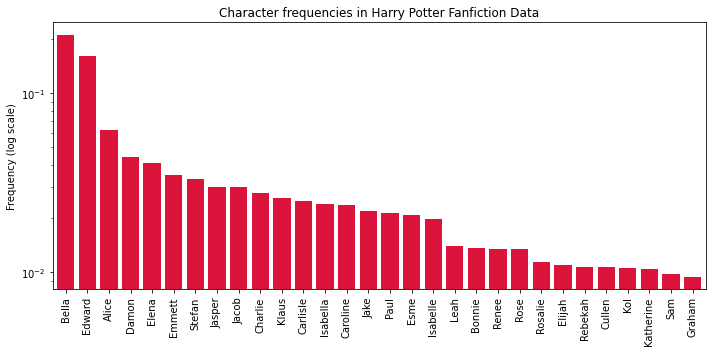

In [19]:
# List characters by the frequency with which they are mentioned
# result = [item for items, c in Counter(x).most_common()
#                                      for item in [items] * c]
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

all_people = flatten(all_people)
ap_counter = Counter(all_people)
# print(Counter(all_people).most_common())
y = [count for tag, count in ap_counter.most_common(30)]
total = sum(y)
y = [v/total for v in y]
# total = sum(ap_counter.values())
# result = {k: v / total for k,v in ap_counter.items()}
# print(result)
# print(y)
x = [tag for tag, count in ap_counter.most_common(30)]

plt.figure(figsize=(10, 5))
plt.bar(x, y, color='crimson')
plt.title("Character frequencies in Harry Potter Fanfiction Data")
plt.ylabel("Frequency (log scale)")
plt.yscale('log') # optionally set a log scale for the y-axis
plt.xticks(rotation=90)
# for i, (tag, count) in enumerate(ap_counter.most_common(30)):
#     plt.text(i, count, f' {count} ', rotation=90,
#              ha='center', va='top' if i < 15 else 'bottom', color='white' if i < 15 else 'black')
plt.xlim(-0.6, len(x)-0.4) # optionally set tighter x lims
plt.tight_layout() # change the whitespace such that all labels fit nicely
plt.show()

In [20]:
# Main function for Originals
from os import listdir
from os.path import isfile, join

path = "/content/drive/MyDrive/Taneea Project/Original Books/Twilight"
onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
all_people_orig = []

for filename in onlyfiles:
  print("Processing file: ", filename)
  clean_story = read_original_file(path + '/' + filename)
  if len(clean_story) == 0:
    print("Empty story\n")
    continue
  # print(clean_story)
  # break
  print("Getting people for file: ", filename)
  people = get_people(clean_story)
  all_people_orig.append(people)
  # break

print(all_people_orig)

Processing file:  book1.txt
Getting people for file:  book1.txt
2022-12-12 22:07:40,783 loading file /root/.flair/models/ner-english/4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:07:42,386 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 4911/4911 [06:32<00:00, 12.50it/s]


Processing file:  book2.txt
Getting people for file:  book2.txt
2022-12-12 22:14:16,018 loading file /root/.flair/models/ner-english/4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:14:17,816 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 5400/5400 [07:19<00:00, 12.27it/s]


Processing file:  book3.txt
Getting people for file:  book3.txt
2022-12-12 22:21:38,517 loading file /root/.flair/models/ner-english/4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:21:40,291 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 12297/12297 [08:41<00:00, 23.56it/s]


Processing file:  book4.txt
Getting people for file:  book4.txt
2022-12-12 22:30:22,994 loading file /root/.flair/models/ner-english/4f4cdab26f24cb98b732b389e6cebc646c36f54cfd6e0b7d3b90b25656e4262f.8baa8ae8795f4df80b28e7f7b61d788ecbb057d1dc85aacb316f1bd02837a4a4


/usr/local/lib/python3.8/dist-packages/huggingface_hub/file_download.py:594: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(


2022-12-12 22:30:24,723 SequenceTagger predicts: Dictionary with 20 tags: <unk>, O, S-ORG, S-MISC, B-PER, E-PER, S-LOC, B-ORG, E-ORG, I-PER, S-PER, B-MISC, I-MISC, E-MISC, I-ORG, B-LOC, E-LOC, I-LOC, <START>, <STOP>


100%|██████████| 13225/13225 [10:28<00:00, 21.05it/s]

[['Noble', 'Charlie', 'Bella', 'Phil', 'Charlie', 'Don', 'Charlie', 'Charlie', 'Charlie Neither', 'Charlie', 'Charlie', 'Swan', 'Charlie', 'Bells', 'Charlie', 'Washington', 'Billy Black', 'Charlie', 'Charlie', 'Billy', 'Bella', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Charlie', 'Billy', 'Charlie', 'Isabella Swan I', 'Charlie', 'Mason', 'Chaucer Faulkner I', 'Isabella Swan', 'Bella', 'Jefferson', 'Eric', 'Eric', 'Varner', 'Eric', 'Edward', 'Emmett Cullen', 'Rosalie', 'Jasper Hale', 'Alice Cullen', 'Cullen', 'Jessica', 'Jessica', 'Jessica', 'Emmett', 'Rosalie', 'Jasper', 'Alice', 'Cullens', 'Cullen', 'Jasper', 'Rosalie', 'Cullen', 'Jessica', 'Cullen', 'Pity', 'Cullens', 'Edward He', 'Edward', 'Jessica', 'Angela', 'Angela', 'Edward Cullen', 'Banner', 'Jessica', 'Edward Cullen', 'Aren', 'Isabella Swan', 'Bella', 'Mike', 'Hi Mike', 'Edward Cullen', 'Edward Cullen', 'Mike', 'Clapp', 'Edward Cullen', 'Edward Cull

In [ ]:
all_people_orig

[['Noble',
  'Charlie',
  'Bella',
  'Phil',
  'Charlie',
  'Don',
  'Charlie',
  'Charlie',
  'Charlie Neither',
  'Charlie',
  'Charlie',
  'Swan',
  'Charlie',
  'Bells',
  'Charlie',
  'Washington',
  'Billy Black',
  'Charlie',
  'Charlie',
  'Billy',
  'Bella',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Charlie',
  'Billy',
  'Charlie',
  'Isabella Swan I',
  'Charlie',
  'Mason',
  'Chaucer Faulkner I',
  'Isabella Swan',
  'Bella',
  'Jefferson',
  'Eric',
  'Eric',
  'Varner',
  'Eric',
  'Edward',
  'Emmett Cullen',
  'Rosalie',
  'Jasper Hale',
  'Alice Cullen',
  'Cullen',
  'Jessica',
  'Jessica',
  'Jessica',
  'Emmett',
  'Rosalie',
  'Jasper',
  'Alice',
  'Cullens',
  'Cullen',
  'Jasper',
  'Rosalie',
  'Cullen',
  'Jessica',
  'Cullen',
  'Pity',
  'Cullens',
  'Edward He',
  'Edward',
  'Jessica',
  'Angela',
  'Angela',
  'Edward Cullen',
  'Banner',
  'Jessica',


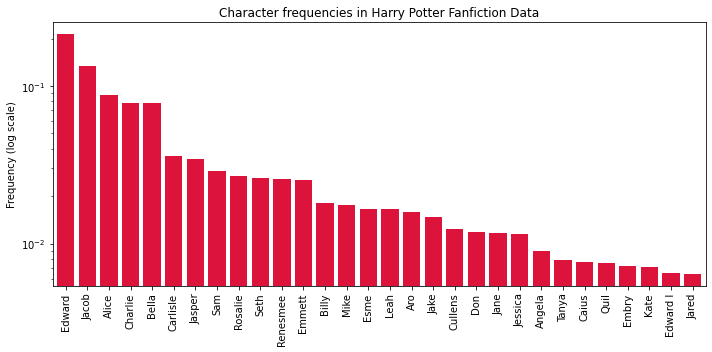

In [22]:
# List characters by the frequency with which they are mentioned
# result = [item for items, c in Counter(x).most_common()
#                                      for item in [items] * c]
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

all_people_orig = flatten(all_people_orig)
ap_counter = Counter(all_people_orig)
# print(Counter(all_people).most_common())
y = [count for tag, count in ap_counter.most_common(30)]
total = sum(y)
y = [v/total for v in y]
# total = sum(ap_counter.values())
# result = {k: v / total for k,v in ap_counter.items()}
# print(result)
# print(y)
x = [tag for tag, count in ap_counter.most_common(30)]

plt.figure(figsize=(10, 5))
plt.bar(x, y, color='crimson')
plt.title("Character frequencies in Harry Potter Fanfiction Data")
plt.ylabel("Frequency (log scale)")
plt.yscale('log') # optionally set a log scale for the y-axis
plt.xticks(rotation=90)
# for i, (tag, count) in enumerate(ap_counter.most_common(30)):
#     plt.text(i, count, f' {count} ', rotation=90,
#              ha='center', va='top' if i < 15 else 'bottom', color='white' if i < 15 else 'black')
plt.xlim(-0.6, len(x)-0.4) # optionally set tighter x lims
plt.tight_layout() # change the whitespace such that all labels fit nicely
plt.show()

In [23]:
from scipy import stats
from scipy.stats.stats import pearsonr   

all_people = flatten(all_people)
ap_counter = Counter(all_people)
x_fanfic = [tag for tag, count in ap_counter.most_common(30)]
y_fanfic = [count for tag, count in ap_counter.most_common(30)]
total = sum(y_fanfic)
y_fanfic = [v/total for v in y_fanfic] 


all_people_orig = flatten(all_people_orig)
ap_counter_orig = Counter(all_people_orig)
y_orig = [count for tag, count in ap_counter_orig.most_common(30)]
total = sum(y_orig)
y_orig = [v/total for v in y_orig]
x_orig = [tag for tag, count in ap_counter_orig.most_common(30)]

dict_fanfic = {}
dict_orig = {}
for i in range(0, 30):
  dict_fanfic[x_fanfic[i]] = y_fanfic[i]
  dict_orig[x_orig[i]] = y_orig[i]

fanfic = []
orig = []
for k, v in dict_orig.items():
  try:
    fanfic.append(dict_fanfic[k])
    orig.append(v)
  except KeyError:
    fanfic.append(1.0)
    orig.append(v)

print(stats.ttest_ind(orig, fanfic))
print(pearsonr(orig, fanfic))

Ttest_indResult(statistic=-6.31064582281602, pvalue=4.1684994707493365e-08)
(-0.4988477911436241, 0.00501562699925929)


In [ ]:
def get_num_chap(filename):
  file1 = open(filename, 'r')
  lines = file1.readlines()

  for line in lines:
    if "Language: " in line and "English" not in line:
      return False, 0
    if "Chapters: " in line:
      num = line.split(':')
      num_chap = int(num[1])
      break
  
  if num_chap > 2:
    return True, num_chap

  else:
    return False, num_chap


In [ ]:
from os import listdir
from os.path import isfile, join

path = "/content/drive/MyDrive/Taneea Project/Twilight Data files/"
onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
yf = []

for filename in onlyfiles:
  print(filename)
  valid, num = get_num_chap(path + '/' + filename)
  if valid:
    yf.append((filename, num))

yf

Twilight - FireworksandGlitter - Hope.txt
Twilight - FelineSoul1994 - Scales and Tails.txt
Twilight_ Winx Club - Imogen Mulgrew Swan 20 - Winx club season 1.txt
Twilight - FelineSoul1994 - Rosalie's Doll.txt
Twilight - FireworksandGlitter - Friends or Rivals.txt
Twilight - alouqua77 - Bella Volturi.txt
Twilight - alice-cullen-cool - un litro de l_grimas.txt
Twilight - FireworksandGlitter - Where's my red jacket_.txt
Twilight - Fictional-Creature-duh - Beautiful Soul.txt
Twilight_ Vampire Diaries - Secret forever - without you.txt
Twilight_ Vampire Diaries - VampireAngel99 - Izabela Salvatore.txt
Twilight - All The Little Flowers - We'll Wait Forever.txt
Twilight - AliceSweetCandy - Everybody's Changing.txt
Twilight_ X-Men_ The Movie - esmaganga - RE-DO_ Eclipse.txt
Twilight - alice-cullen-cool - en busca del amor.txt
Twilight_ Wolfblood - Divergentfan10163 - Cullens move AGAIN.txt
Twilight - Ficcin - A Good Day Until It Wasn't.txt
Twilight - feebes86 - Already Calling you Mine.txt
Twil

[('Twilight - FelineSoul1994 - Scales and Tails.txt', 4),
 ('Twilight_ Winx Club - Imogen Mulgrew Swan 20 - Winx club season 1.txt', 11),
 ('Twilight_ Vampire Diaries - VampireAngel99 - Izabela Salvatore.txt', 3),
 ('Twilight_ Wolfblood - Divergentfan10163 - Cullens move AGAIN.txt', 3),
 ("Twilight - Ficcin - A Good Day Until It Wasn't.txt", 6),
 ('Twilight - feebes86 - Already Calling you Mine.txt', 3),
 ('Twilight - fiftyshadesofcastle - my story_ my life.txt', 10),
 ('Twilight_ Vampire Knight - polly101 - The Revenge.txt', 3),
 ("Twilight - All That's Left is a Girl - Black Moon Rising.txt", 11),
 ('Twilight - Alice-Cullens-Twin - Fame.txt', 5),
 ('Twilight_ Vampire Diaries - Theydontknowaboutme - Isabella Marie Salvatore.txt',
  7),
 ('Twilight - Ficcin - The Bridesmaids.txt', 3),
 ('Twilight - Fenrir Vanagandr - The Wolves of Paris.txt', 4),
 ('Twilight_ Vampire Diaries - Twilight-gotaluvthemall - Blue Eyes.txt', 29),
 ('Twilight_ Vampire Diaries - TurningFateForYou - Safe In Your

In [ ]:
len(yf)

110